# Downloading the data

In [ ]:
!pip install zarr
!pip install fsspec
!pip install cartopy
!pip install cftime
!pip install os
!pip install --upgrade git+https://github.com/pangeo-data/xESMF.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.4/184.4 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 14.4 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os
  Cloning https://github.com/pangeo-data/xESMF.git to /tmp/pip-req-build-ylvm1uxl
  Running command git clone --filter=blob:none --quiet https://github.com/pangeo-data/xESMF.git /tmp/pip-req-build-ylvm1uxl
  Resolved https://github.com/pangeo-data/xESMF.git to commit feebcfc11147eb00e3256924f0fded1485b7df60
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import scipy.stats as stats
import zarr
import fsspec
import cartopy.crs as ccrs
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,ps,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
1,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rsds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
2,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlus,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
3,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
4,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,psl,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706


In [ ]:
df_ta = df.query("table_id == 'day' & variable_id == 'tas' & member_id == 'r1i1p1f1'")
df_ta

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
919,CMIP,NOAA-GFDL,GFDL-ESM4,esm-hist,r1i1p1f1,day,tas,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/esm-...,NaN,20180701
1022,CMIP,NOAA-GFDL,GFDL-ESM4,esm-piControl,r1i1p1f1,day,tas,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/esm-...,NaN,20180701
1992,CMIP,NOAA-GFDL,GFDL-ESM4,1pctCO2,r1i1p1f1,day,tas,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/1pct...,NaN,20180701
2485,ScenarioMIP,NOAA-GFDL,GFDL-CM4,ssp245,r1i1p1f1,day,tas,gr1,gs://cmip6/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-CM...,NaN,20180701
2492,ScenarioMIP,NOAA-GFDL,GFDL-CM4,ssp245,r1i1p1f1,day,tas,gr2,gs://cmip6/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-CM...,NaN,20180701
...,...,...,...,...,...,...,...,...,...,...,...
515028,ScenarioMIP,AS-RCEC,TaiESM1,ssp245,r1i1p1f1,day,tas,gn,gs://cmip6/CMIP6/ScenarioMIP/AS-RCEC/TaiESM1/s...,NaN,20210222
515198,CMIP,CMCC,CMCC-ESM2,piControl,r1i1p1f1,day,tas,gn,gs://cmip6/CMIP6/CMIP/CMCC/CMCC-ESM2/piControl...,NaN,20210304
515277,CMIP,CMCC,CMCC-CM2-HR4,1pctCO2,r1i1p1f1,day,tas,gn,gs://cmip6/CMIP6/CMIP/CMCC/CMCC-CM2-HR4/1pctCO...,NaN,20210304
515792,ScenarioMIP,CSIRO-ARCCSS,ACCESS-CM2,ssp585,r1i1p1f1,day,tas,gn,gs://cmip6/CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCE...,NaN,20210317


In [ ]:
# df_ta_ = df_ta.query("member_id == 'r1i1p1f1' & source_id=='ACCESS-CM2'")
# df_ta_ncar=df_ta_
# df_ta_ncar

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
378978,ScenarioMIP,CSIRO-ARCCSS,ACCESS-CM2,ssp126,r1i1p1f1,day,tas,gn,gs://cmip6/CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCE...,NaN,20191108


In [ ]:
import google.auth.transport.requests
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/path/to/credentials.json"
!pip install google-auth-oauthlib --quiet
import google.oauth2.credentials

In [ ]:
from google.colab import drive
drive.mount ('/content/drive')
# Define the directory path
dir= '/content/drive/MyDrive/CCRM TP/'

Mounted at /content/drive


In [ ]:
# !pip install --upgrade xarray zarr fsspec s3fs gcsfs

# TASMAX

In [ ]:
import pandas as pd
import numpy as np
import xarray as xr
import gcsfs  # Required for Google Cloud Storage
df_ta = df.query("table_id == 'day' & variable_id == 'tasmin' & member_id == 'r1i1p1f1'")
df_ta
# Define the latitude and longitude range for Bangladesh
lat_range = slice(20.5, 27)
lon_range = slice(88, 93)

# Initialize GCS file system
gcs = gcsfs.GCSFileSystem(token="anon")  # Anonymous access to CMIP6

def download_and_save_data(df_ta, experiment_id, source_id):
    # Filter the DataFrame for the given experiment_id and source_id
    df_ta_filtered = df_ta.query(f"member_id == 'r1i1p1f1' & source_id == '{source_id}' & experiment_id == '{experiment_id}'")

    # Create an empty list to store results
    temperature_data = []

    # Iterate over each row in df_ta_filtered
    for _, row in df_ta_filtered.iterrows():
        zstore = row['zstore']

        try:
            # Open dataset from Google Cloud Storage using gcsfs
            ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)

            # Select temperature variable (assuming it's 'tas' or 'ta')
            temp_var = 'tasmax' if 'tasmax' in ds else 'ta'
            ds_temp = ds[temp_var]

            # Select Bangladesh region
            ds_temp = ds_temp.sel(lat=lat_range, lon=lon_range)

            # Convert Kelvin to Celsius if needed
            if ds_temp.attrs.get('units', '') == 'K':
                ds_temp = ds_temp - 273.15

            # Compute area-weighted average
            weights = np.cos(np.deg2rad(ds_temp.lat))
            ds_weighted = ds_temp.weighted(weights)

            # Compute monthly mean
            ds_monthly_avg = ds_weighted.mean(dim=['lat', 'lon']).resample(time='1M').mean()

            # Convert to DataFrame and store results
            df_temp = ds_monthly_avg.to_dataframe().reset_index()
            df_temp['source_id'] = source_id
            temperature_data.append(df_temp)

        except Exception as e:
            print(f"Error processing {zstore}: {e}")

    # Ensure the list is not empty before concatenation
    if temperature_data:
        df_monthly_temperature = pd.concat(temperature_data, ignore_index=True)

        # Save the DataFrame to an Excel file
        output_file = f"/content/drive/MyDrive/CCRM TP/{experiment_id}_{source_id}_monthly_temperatures.xlsx"
        try:
            with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
                df_monthly_temperature.to_excel(writer, sheet_name='Monthly Temperatures', index=False)
            print(f"DataFrame successfully saved to {output_file}")
        except Exception as e:
            print(f"An error occurred while saving {output_file}: {e}")
    else:
        print(f"No valid data was extracted for {experiment_id} and {source_id}.")

# Define the combinations of experiment_id and source_id to process
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['INM-CM4-8', 'INM-CM5-0', 'ACCESS-CM2', 'IPSL-CM6A-LR']

# Loop through each combination and process the data
for experiment_id in experiment_ids:
    for source_id in source_ids:
        download_and_save_data(df_ta, experiment_id, source_id)

Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM4-8/ssp585/r1i1p1f1/day/tasmin/gr1/v20190603/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp585 and INM-CM4-8.
Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM5-0/ssp585/r1i1p1f1/day/tasmin/gr1/v20190724/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp585 and INM-CM5-0.


<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)
<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)
<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning us

Error processing gs://cmip6/CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCESS-CM2/ssp585/r1i1p1f1/day/tasmin/gn/v20210317/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp585 and ACCESS-CM2.
Error processing gs://cmip6/CMIP6/ScenarioMIP/IPSL/IPSL-CM6A-LR/ssp585/r1i1p1f1/day/tasmin/gr/v20190903/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lon', 'tasmin', 'time', 'time_bounds']"
No valid data was extracted for ssp585 and IPSL-CM6A-LR.
Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM4-8/ssp126/r1i1p1f1/day/tasmin/gr1/v20190603/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp126 and INM-CM4-8.
Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM5-0/ssp126/r1i1p1f1/day/tasmin/gr1/v20190619/: "No variable na

<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)
<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning use a coarser resolution 'time_unit' or specify 'use_cftime=True'.
  ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)
<ipython-input-7-3aa5669a6d27>:27: SerializationWarning: Unable to decode time axis into full numpy.datetime64[ns] objects, continuing using cftime.datetime objects instead, reason: dates out of range. To silence this warning us

Error processing gs://cmip6/CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCESS-CM2/ssp126/r1i1p1f1/day/tasmin/gn/v20210317/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp126 and ACCESS-CM2.
Error processing gs://cmip6/CMIP6/ScenarioMIP/IPSL/IPSL-CM6A-LR/ssp126/r1i1p1f1/day/tasmin/gr/v20190903/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lon', 'tasmin', 'time', 'time_bounds']"
No valid data was extracted for ssp126 and IPSL-CM6A-LR.
Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM4-8/ssp370/r1i1p1f1/day/tasmin/gr1/v20190603/: "No variable named 'ta'. Variables on the dataset include ['height', 'lat', 'lat_bnds', 'lon', 'lon_bnds', 'tasmin', 'time', 'time_bnds']"
No valid data was extracted for ssp370 and INM-CM4-8.
Error processing gs://cmip6/CMIP6/ScenarioMIP/INM/INM-CM5-0/ssp370/r1i1p1f1/day/tasmin/gr1/v20190618/: "No variable na

In [ ]:
import pandas as pd
import numpy as np
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/"

# Define the experiment IDs and source IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['INM-CM4-8', 'INM-CM5-0', 'ACCESS-CM2', 'IPSL-CM6A-LR']

# Create an empty dictionary to store dataframes for each experiment
ensemble_data = {exp: [] for exp in experiment_ids}

# Load data for each experiment and source
for experiment_id in experiment_ids:
    for source_id in source_ids:
        file_path = os.path.join(data_dir, f"{experiment_id}_{source_id}_monthly_temperatures.xlsx")

        if os.path.exists(file_path):
            df = pd.read_excel(file_path)

            # Explicitly select time and temperature columns
            time_col = df.columns[0]  # First column (time)
            temp_col = df.columns[2]  # Third column (tasmax)

            # Ensure 'time' is in datetime format
            df[time_col] = pd.to_datetime(df[time_col])

            # Set 'time' as the index
            df.set_index(time_col, inplace=True)

            # Convert temperature column to numeric, coercing errors to NaN
            df[temp_col] = pd.to_numeric(df[temp_col], errors='coerce')

            # Drop rows with NaN values (optional, depending on your use case)
            df.dropna(inplace=True)

            # Append the cleaned dataframe to the list
            ensemble_data[experiment_id].append(df[temp_col])  # Only append the temperature column
        else:
            print(f"File not found: {file_path}")

# Function to calculate the ensemble mean
def calculate_ensemble_mean(dataframes):
    # Concatenate all dataframes along the columns
    combined = pd.concat(dataframes, axis=1)

    # Calculate the mean across all models for each time step
    ensemble_mean = combined.mean(axis=1)

    # Calculate ensemble statistics (optional)
    ensemble_std = combined.std(axis=1)  # Standard deviation
    ensemble_min = combined.min(axis=1)  # Minimum
    ensemble_max = combined.max(axis=1)  # Maximum

    # Return as a DataFrame
    return pd.DataFrame({
        'ensemble_mean': ensemble_mean,
        'ensemble_std': ensemble_std,
        'ensemble_min': ensemble_min,
        'ensemble_max': ensemble_max
    })

# Calculate ensemble mean for each experiment
ensemble_results = {}
for experiment_id, dataframes in ensemble_data.items():
    if dataframes:  # Check if there are dataframes for this experiment
        ensemble_results[experiment_id] = calculate_ensemble_mean(dataframes)

# Save ensemble results to Excel files
for experiment_id, df_ensemble in ensemble_results.items():
    output_file = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")
    df_ensemble.to_excel(output_file, index=True)
    print(f"Ensemble results for {experiment_id} saved to {output_file}")

File not found: /content/drive/MyDrive/CCRM TP/ssp585_INM-CM4-8_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp585_INM-CM5-0_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp585_ACCESS-CM2_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp585_IPSL-CM6A-LR_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp126_INM-CM4-8_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp126_INM-CM5-0_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp126_ACCESS-CM2_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp126_IPSL-CM6A-LR_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp370_INM-CM4-8_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp370_INM-CM5-0_monthly_temperatures.xlsx
File not found: /content/drive/MyDrive/CCRM TP/ssp370_ACCESS-CM2_monthly_temperatures.xlsx
F

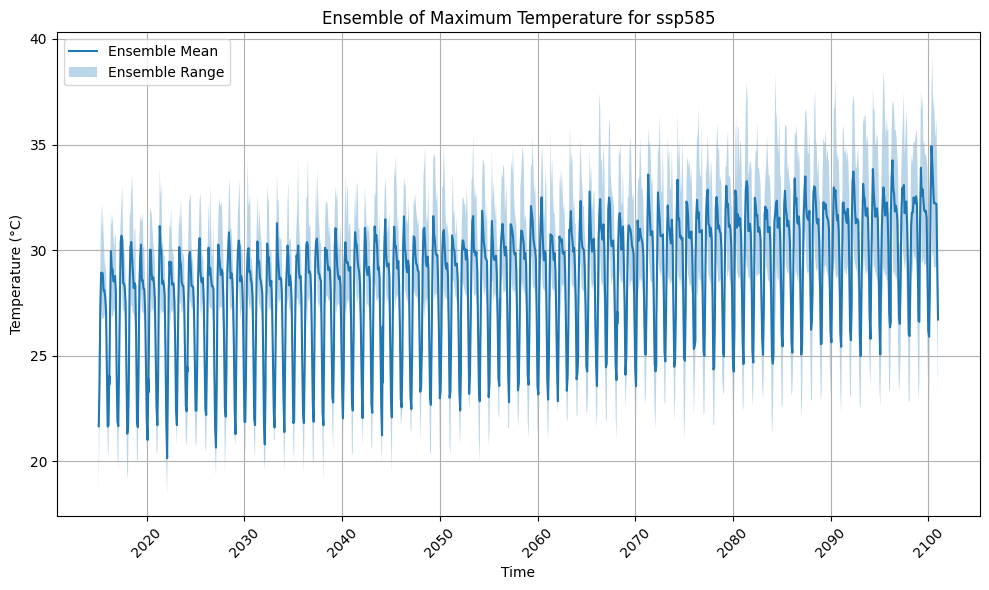

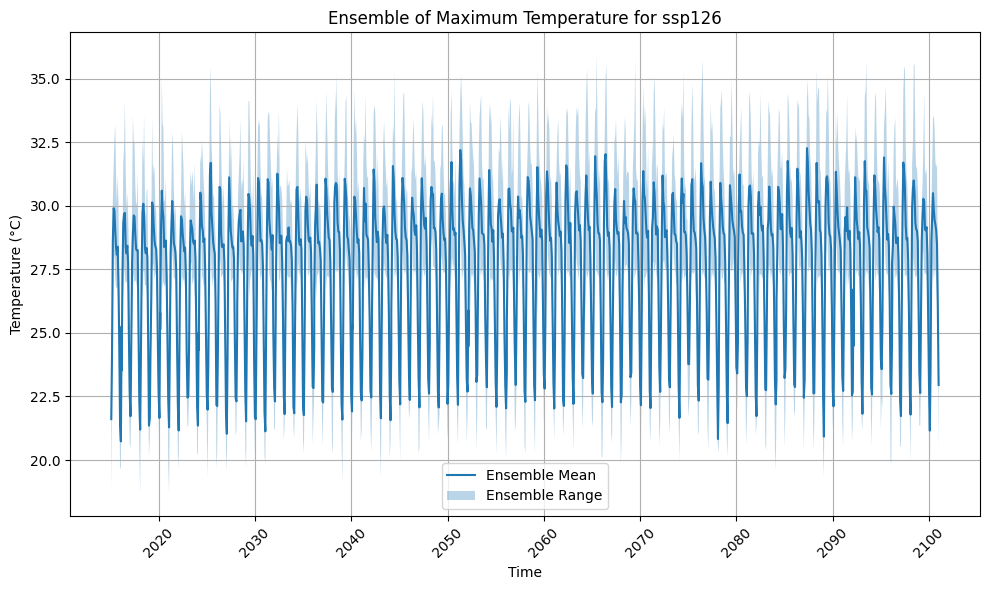

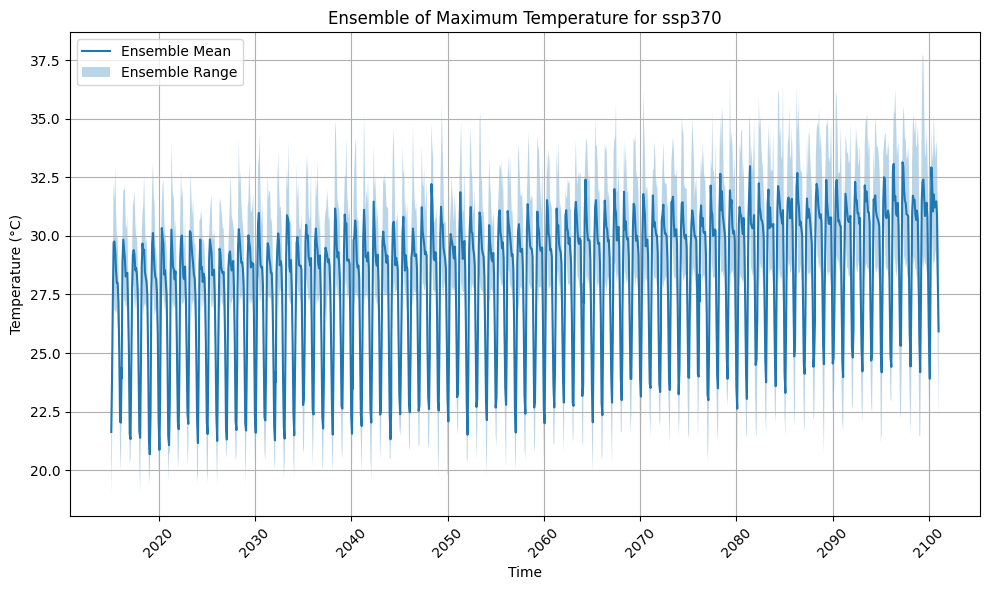

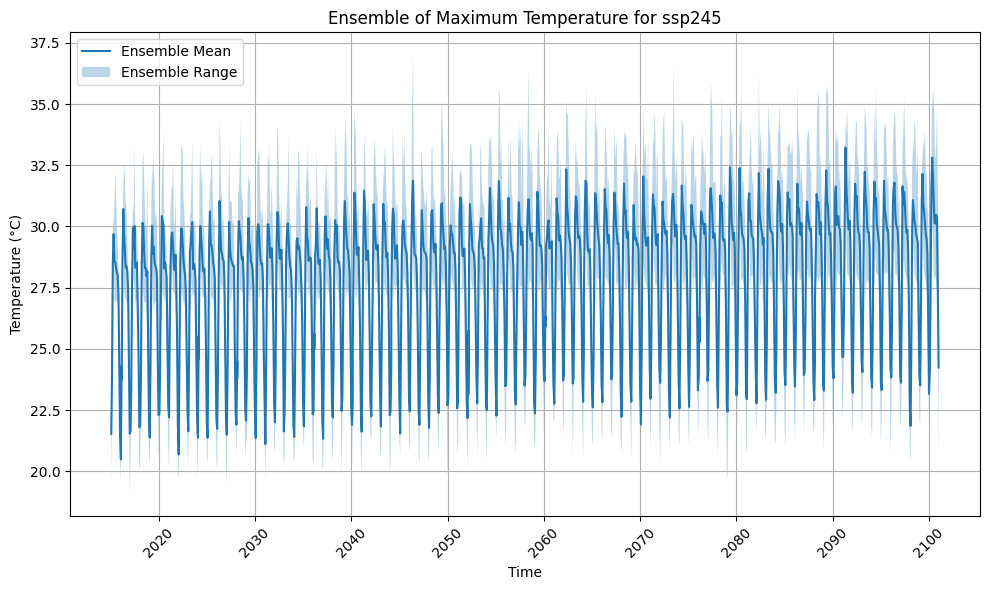

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Loop through each experiment and plot the ensemble mean
for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)  # Read with the first column as index

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(df_ensemble.index, df_ensemble['ensemble_mean'], label='Ensemble Mean')
        plt.fill_between(df_ensemble.index, df_ensemble['ensemble_min'], df_ensemble['ensemble_max'], alpha=0.3, label='Ensemble Range')
        plt.xlabel('Time')
        plt.ylabel('Temperature (°C)')
        plt.title(f'Ensemble of Maximum Temperature for {experiment_id}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.tight_layout()  # Adjust layout to prevent labels from overlapping
        plt.show()
    else:
        print(f"File not found: {file_path}")


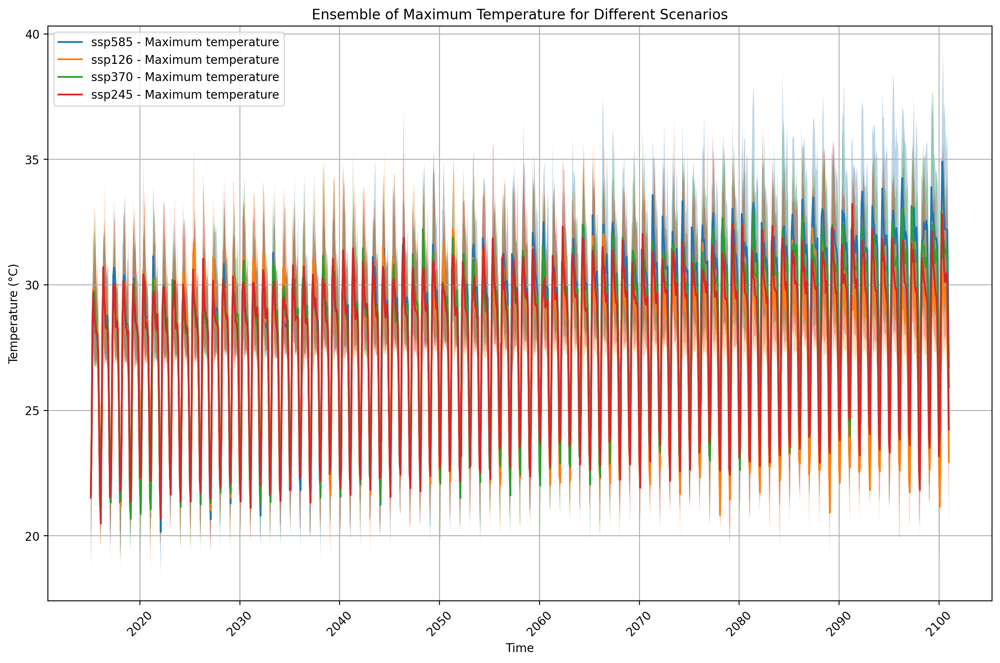

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmax"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create a single figure and axes
plt.figure(figsize=(12, 8))  # Adjust figure size as needed
ax = plt.gca()  # Get current axes

# Loop through each experiment and plot on the same axes
for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)

        # Plotting on the same axes
        ax.plot(df_ensemble.index, df_ensemble['ensemble_mean'], label=f'{experiment_id} - Maximum temperature')
        ax.fill_between(df_ensemble.index, df_ensemble['ensemble_min'], df_ensemble['ensemble_max'], alpha=0.3)  # No need to label fill_between again

    else:
        print(f"File not found: {file_path}")

# Set plot labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Ensemble of Maximum Temperature for Different Scenarios')

# Add legend and grid
ax.legend()
ax.grid(True)

# Rotate x-axis labels and adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-23-70c360561bd7>:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-23-70c360561bd7>:33: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()
<ipython-input-23-70c360561bd7>:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-23-70c360561bd7>:33: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()
<ipython-input-23-70c360561bd7>:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_m

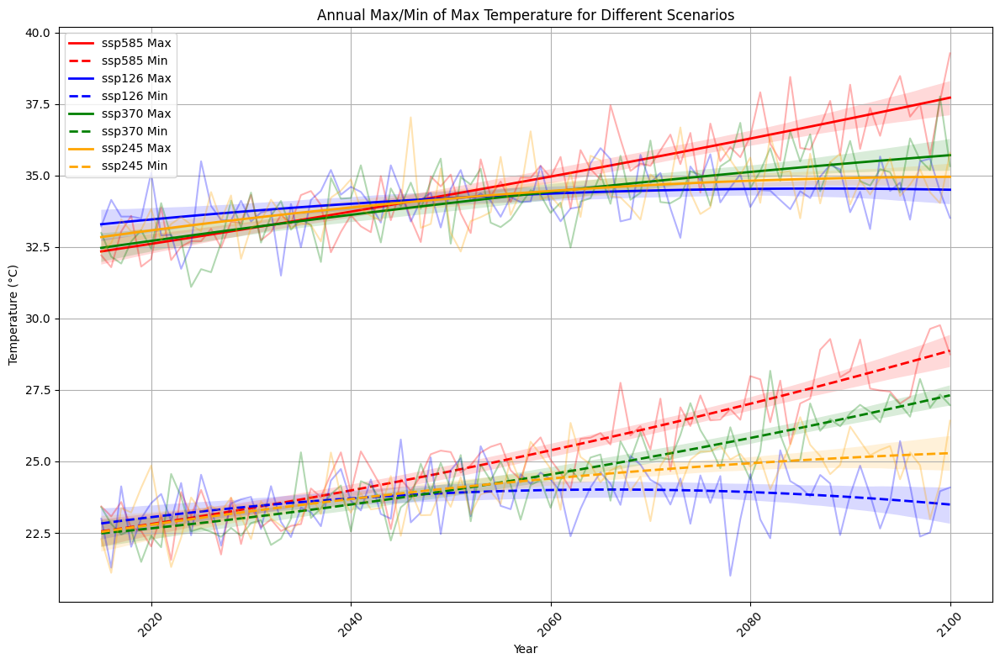

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.lines import Line2D  # For custom legend

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmax"

# Define the experiment IDs and corresponding colors
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
colors = ['red', 'blue', 'green', 'orange']  # Assign colors to each experiment ID

# Create a single figure and axes
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Store legend handles for trendlines
trendline_handles = []

# Loop through each experiment and plot on the same axes
for experiment_id, color in zip(experiment_ids, colors):
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)

        # Ensure the index is in datetime format
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual max and min of the ensemble maximum
        annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
        annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()

        # Plot SSP lines with lower opacity
        ax.plot(annual_max_of_max.index.year, annual_max_of_max.values, color=color, alpha=0.3)
        ax.plot(annual_min_of_max.index.year, annual_min_of_max.values, color=color, alpha=0.3)

        # Add trendline for annual max values
        sns.regplot(x=annual_max_of_max.index.year, y=annual_max_of_max.values,
                    scatter=False, color=color, order=2, line_kws={"linewidth": 2})

        # Add trendline for annual min values
        sns.regplot(x=annual_min_of_max.index.year, y=annual_min_of_max.values,
                    scatter=False, color=color, order=2, line_kws={"linewidth": 2, "linestyle": "dashed"})

        # Store trendline legend handle (solid line for max, dashed for min)
        trendline_handles.append(Line2D([0], [0], color=color, lw=2, label=f'{experiment_id} Max'))
        trendline_handles.append(Line2D([0], [0], color=color, lw=2, linestyle='dashed', label=f'{experiment_id} Min'))

    else:
        print(f"File not found: {file_path}")

# Set plot labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Annual Max/Min of Max Temperature for Different Scenarios')

# Add custom legend (trendlines only)
ax.legend(handles=trendline_handles, loc='upper left')

# Add grid for readability
ax.grid(True)

# Rotate x-axis labels and adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-14-009e8b80c089>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 25).resample('Y').sum()


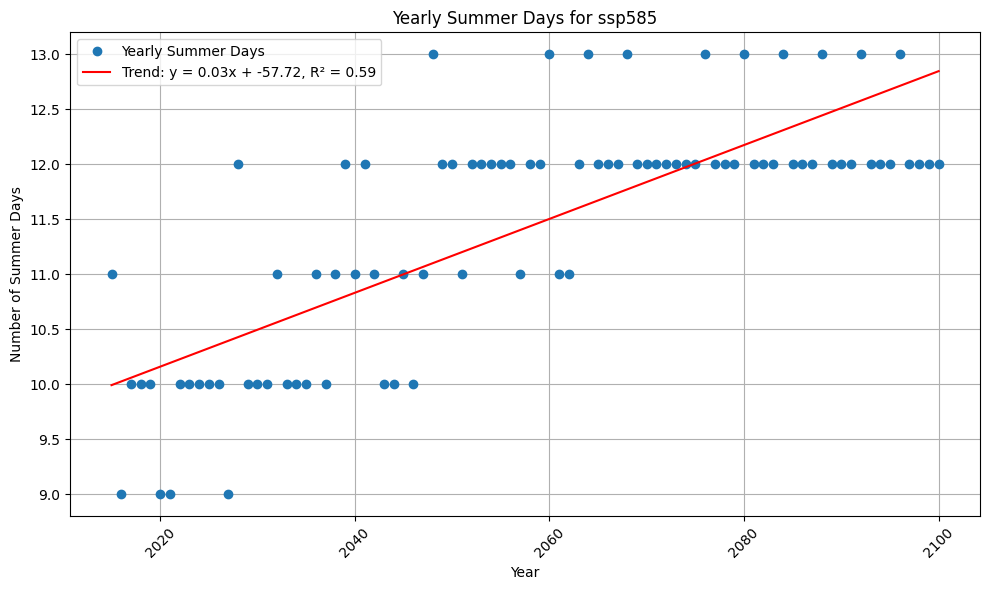

<ipython-input-14-009e8b80c089>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 25).resample('Y').sum()


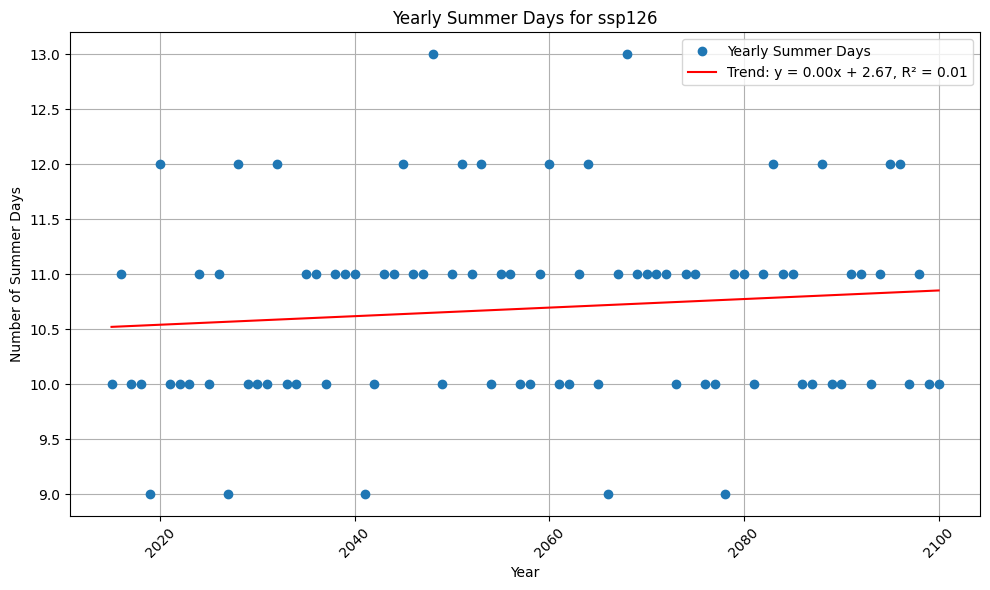

<ipython-input-14-009e8b80c089>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 25).resample('Y').sum()


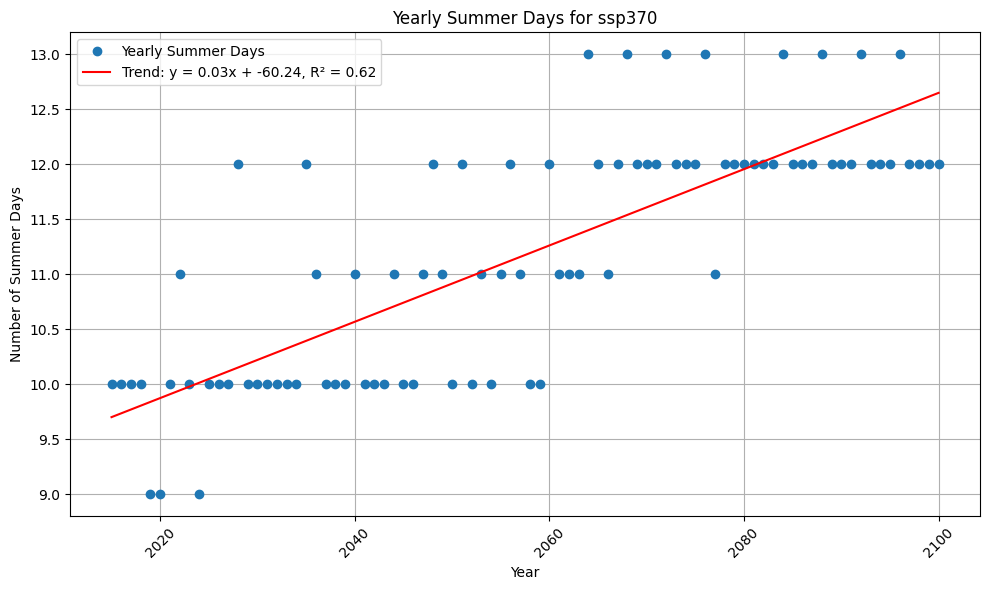

<ipython-input-14-009e8b80c089>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 25).resample('Y').sum()


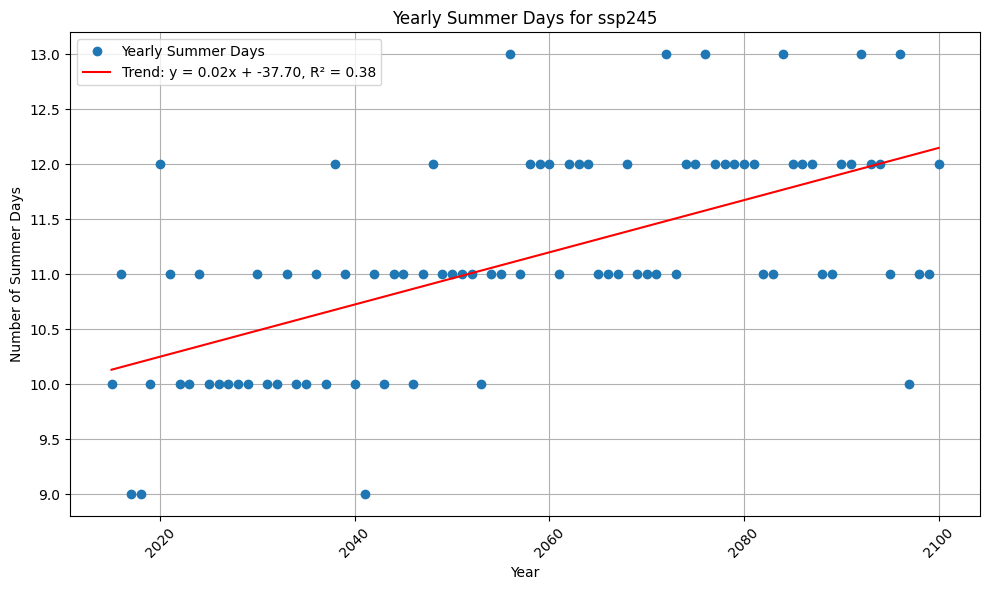

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats # Import stats module from scipy

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate yearly summer days (days with maximum temperature > 25°C)
        summer_days = (df_ensemble['ensemble_max'] > 25).resample('Y').sum()

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(summer_days.index.year, summer_days.values, 'o', label='Yearly Summer Days')  # Dot plot

        # Calculate trend line
        slope, intercept, r_value, p_value, std_err = stats.linregress(summer_days.index.year, summer_days.values)
        trend_line = slope * summer_days.index.year + intercept

        plt.plot(summer_days.index.year, trend_line, 'r-', label=f'Trend: y = {slope:.2f}x + {intercept:.2f}, R² = {r_value**2:.2f}')

        plt.xlabel('Year')
        plt.ylabel('Number of Summer Days')
        plt.title(f'Yearly Summer Days for {experiment_id}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    else:
        print(f"File not found: {file_path}")

<ipython-input-18-a8bfccc7651e>:20: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 20).resample('Y').sum()


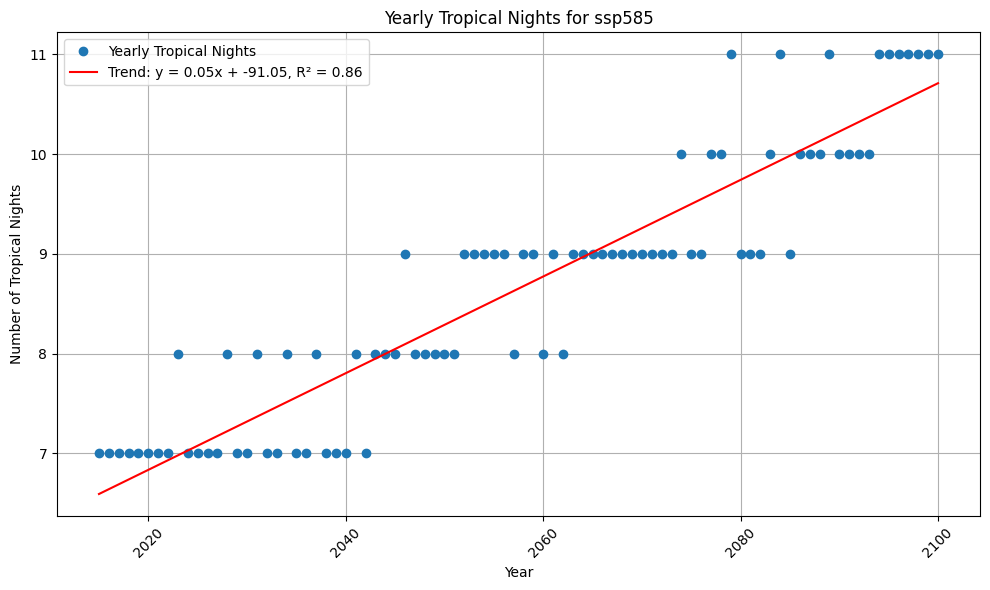

<ipython-input-18-a8bfccc7651e>:20: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 20).resample('Y').sum()


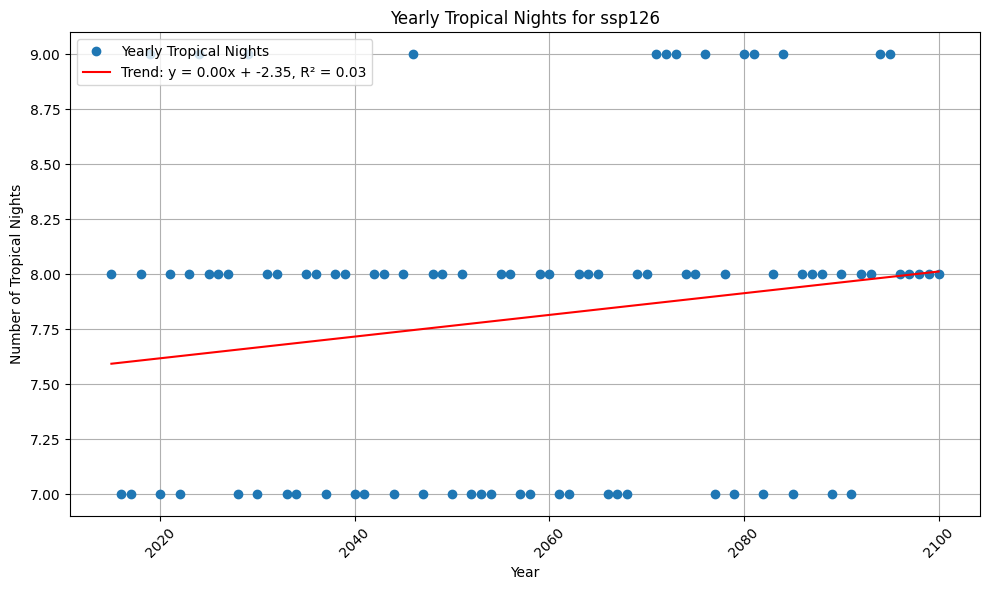

<ipython-input-18-a8bfccc7651e>:20: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 20).resample('Y').sum()


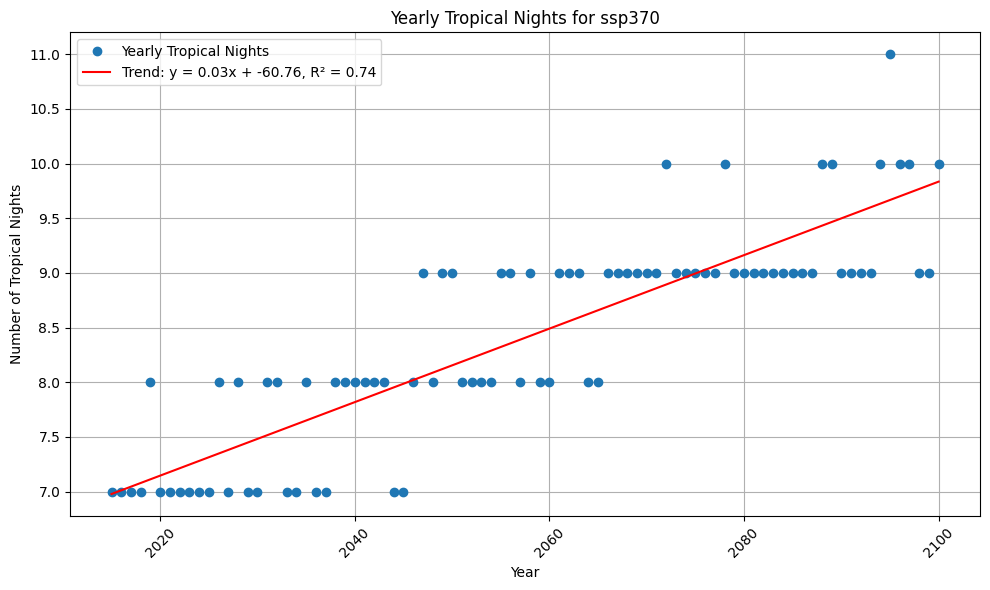

<ipython-input-18-a8bfccc7651e>:20: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  summer_days = (df_ensemble['ensemble_max'] > 20).resample('Y').sum()


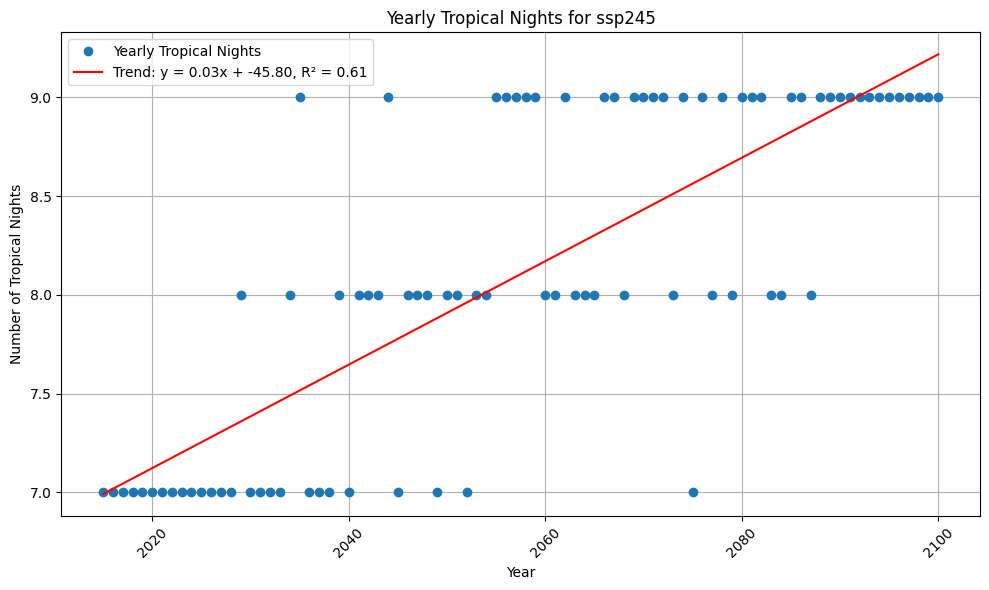

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats # Import stats module from scipy

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate yearly summer days (days with maximum temperature > 25°C)
        summer_days = (df_ensemble['ensemble_max'] > 20).resample('Y').sum()

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(summer_days.index.year, summer_days.values, 'o', label='Yearly Tropical Nights')  # Dot plot

        # Calculate trend line
        slope, intercept, r_value, p_value, std_err = stats.linregress(summer_days.index.year, summer_days.values)
        trend_line = slope * summer_days.index.year + intercept

        plt.plot(summer_days.index.year, trend_line, 'r-', label=f'Trend: y = {slope:.2f}x + {intercept:.2f}, R² = {r_value**2:.2f}')

        plt.xlabel('Year')
        plt.ylabel('Number of Tropical Nights')
        plt.title(f'Yearly Tropical Nights for {experiment_id}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    else:
        print(f"File not found: {file_path}")

<ipython-input-20-6dedac0fcfd0>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-20-6dedac0fcfd0>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-20-6dedac0fcfd0>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-20-6dedac0fcfd0>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()


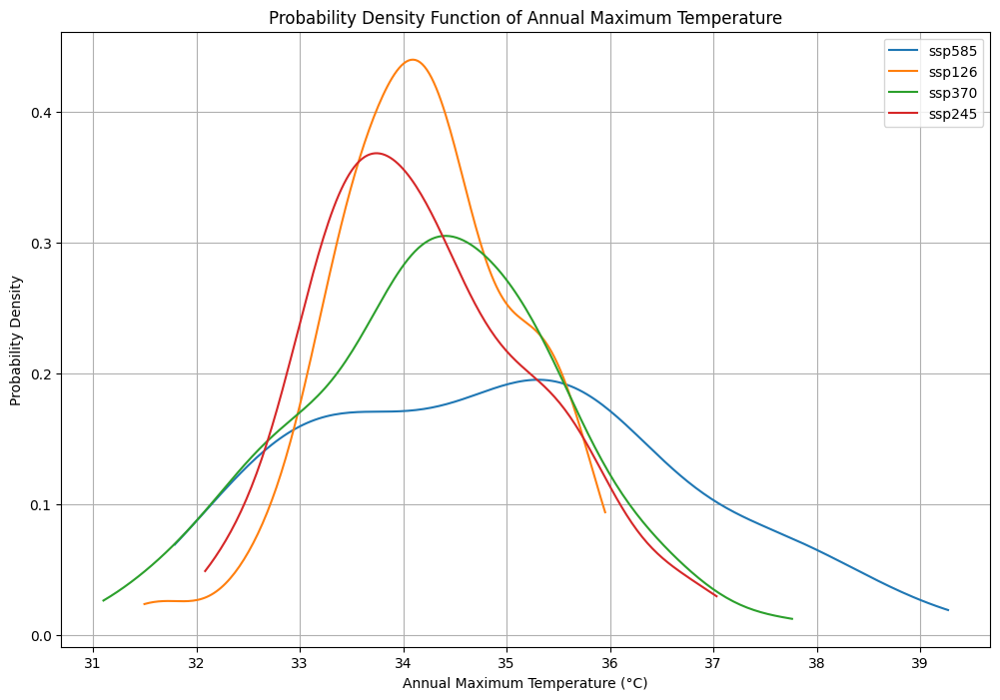

In [ ]:
# prompt: Probability density function of Maximum temperature in different scenarios in a single plot

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import scipy.stats as stats

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create the plot
plt.figure(figsize=(12, 8))

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_temperatures.xlsx")
    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual maximum temperature
        annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()

        # Fit a kernel density estimate (KDE)
        density = stats.gaussian_kde(annual_max_temp)
        x_values = np.linspace(annual_max_temp.min(), annual_max_temp.max(), 200)
        y_values = density(x_values)

        # Plot the KDE
        plt.plot(x_values, y_values, label=experiment_id)

plt.xlabel('Annual Maximum Temperature (°C)')
plt.ylabel('Probability Density')
plt.title('Probability Density Function of Annual Maximum Temperature')
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-23-ee95c4e77194>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-23-ee95c4e77194>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-23-ee95c4e77194>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-23-ee95c4e77194>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()


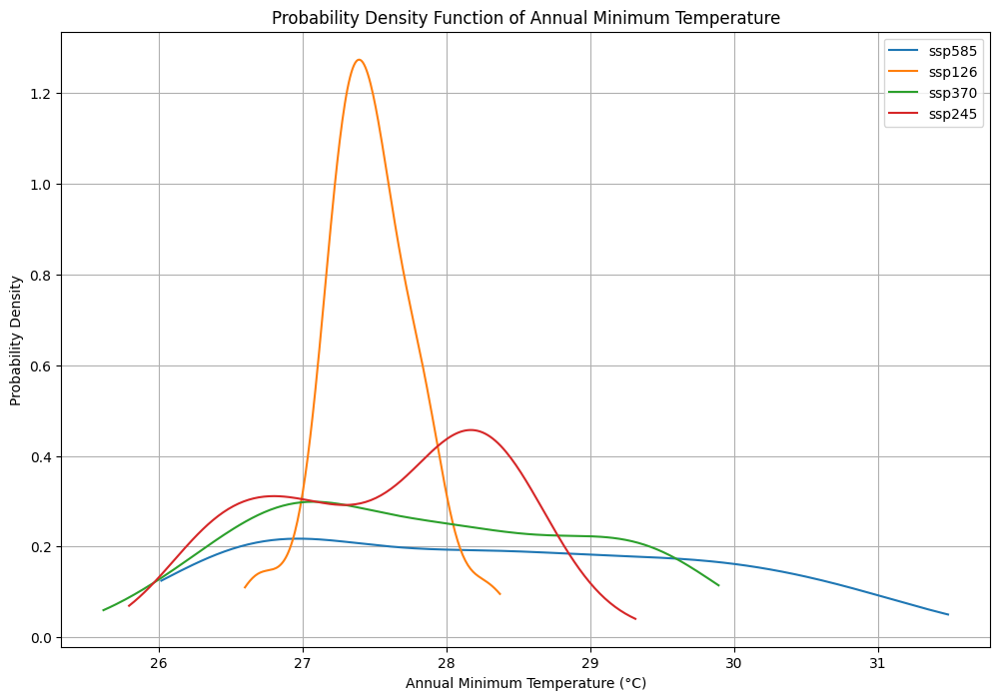

In [ ]:
# prompt: Probability density function of Maximum temperature in different scenarios in a single plot

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import scipy.stats as stats

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create the plot
plt.figure(figsize=(12, 8))

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")
    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual maximum temperature
        annual_max_temp = df_ensemble['ensemble_max'].resample('Y').max()

        # Fit a kernel density estimate (KDE)
        density = stats.gaussian_kde(annual_max_temp)
        x_values = np.linspace(annual_max_temp.min(), annual_max_temp.max(), 200)
        y_values = density(x_values)

        # Plot the KDE
        plt.plot(x_values, y_values, label=experiment_id)

plt.xlabel('Annual Minimum Temperature (°C)')
plt.ylabel('Probability Density')
plt.title('Probability Density Function of Annual Minimum Temperature')
plt.legend()
plt.grid(True)
plt.show()


# TASMIN


In [ ]:
import pandas as pd
import numpy as np
import xarray as xr
import gcsfs  # Required for Google Cloud Storage

# Define the latitude and longitude range for Bangladesh
lat_range = slice(20.5, 27)
lon_range = slice(88, 93)

# Initialize GCS file system
gcs = gcsfs.GCSFileSystem(token="anon")  # Anonymous access to CMIP6

def download_and_save_data(df_ta, experiment_id, source_id):
    # Filter the DataFrame for the given experiment_id and source_id
    df_ta_filtered = df_ta.query(f"member_id == 'r1i1p1f1' & source_id == '{source_id}' & experiment_id == '{experiment_id}'")

    # Create an empty list to store results
    temperature_data = []

    # Iterate over each row in df_ta_filtered
    for _, row in df_ta_filtered.iterrows():
        zstore = row['zstore']

        try:
            # Open dataset from Google Cloud Storage using gcsfs
            ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)

            # Select temperature variable (assuming it's 'tas' or 'ta')
            temp_var = 'tasmin' if 'tasmin' in ds else 'ta'
            ds_temp = ds[temp_var]

            # Select Bangladesh region
            ds_temp = ds_temp.sel(lat=lat_range, lon=lon_range)

            # Convert Kelvin to Celsius if needed
            if ds_temp.attrs.get('units', '') == 'K':
                ds_temp = ds_temp - 273.15

            # Compute area-weighted average
            weights = np.cos(np.deg2rad(ds_temp.lat))
            ds_weighted = ds_temp.weighted(weights)

            # Compute monthly mean
            ds_monthly_avg = ds_weighted.mean(dim=['lat', 'lon']).resample(time='1M').mean()

            # Convert to DataFrame and store results
            df_temp = ds_monthly_avg.to_dataframe().reset_index()
            df_temp['source_id'] = source_id
            temperature_data.append(df_temp)

        except Exception as e:
            print(f"Error processing {zstore}: {e}")

    # Ensure the list is not empty before concatenation
    if temperature_data:
        df_monthly_temperature = pd.concat(temperature_data, ignore_index=True)

        # Save the DataFrame to an Excel file
        output_file = f"/content/drive/MyDrive/CCRM TP/tasmin/{experiment_id}_{source_id}_monthly_temperatures.xlsx"
        try:
            with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
                df_monthly_temperature.to_excel(writer, sheet_name='Monthly Temperatures', index=False)
            print(f"DataFrame successfully saved to {output_file}")
        except Exception as e:
            print(f"An error occurred while saving {output_file}: {e}")
    else:
        print(f"No valid data was extracted for {experiment_id} and {source_id}.")

# Define the combinations of experiment_id and source_id to process
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['INM-CM4-8', 'INM-CM5-0', 'ACCESS-CM2', 'IPSL-CM6A-LR']

# Loop through each combination and process the data
for experiment_id in experiment_ids:
    for source_id in source_ids:
        download_and_save_data(df_ta, experiment_id, source_id)

<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp585_INM-CM4-8_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp585_INM-CM5-0_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/coding/times.py:1133: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.11/dist-packages/xarray/coding/times.py:1133: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.11/dist-packages/xarray/core/indexing.py:511: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'M

DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp585_ACCESS-CM2_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp585_IPSL-CM6A-LR_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp126_INM-CM4-8_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp126_INM-CM5-0_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/coding/times.py:1133: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.11/dist-packages/xarray/coding/times.py:1133: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.11/dist-packages/xarray/core/indexing.py:511: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'M

DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp126_ACCESS-CM2_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp126_IPSL-CM6A-LR_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp370_INM-CM4-8_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp370_INM-CM5-0_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp370_ACCESS-CM2_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp370_IPSL-CM6A-LR_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp245_INM-CM4-8_monthly_temperatures.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp245_INM-CM5-0_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp245_ACCESS-CM2_monthly_temperatures.xlsx


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp245_IPSL-CM6A-LR_monthly_temperatures.xlsx


In [ ]:
pip install cftime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.2 MB/s eta 0:00:00


In [ ]:
pip install cftime
import pandas as pd
import numpy as np
import os
import cftime
# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin/"

# Define the experiment IDs and source IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['INM-CM4-8', 'INM-CM5-0', 'ACCESS-CM2', 'IPSL-CM6A-LR']

# Create an empty dictionary to store dataframes for each experiment
ensemble_data = {exp: [] for exp in experiment_ids}

# Load data for each experiment and source
for experiment_id in experiment_ids:
    for source_id in source_ids:
        file_path = os.path.join(data_dir, f"{experiment_id}_{source_id}_monthly_temperatures.xlsx")

        if os.path.exists(file_path):
            df = pd.read_excel(file_path)

            # Explicitly select time and temperature columns
            time_col = df.columns[0]  # First column (time)
            temp_col = df.columns[2]  # Third column (tasmax)

            # Ensure 'time' is in datetime format
            df[time_col] = pd.to_datetime(df[time_col])

            # Set 'time' as the index
            df.set_index(time_col, inplace=True)

            # Convert temperature column to numeric, coercing errors to NaN
            df[temp_col] = pd.to_numeric(df[temp_col], errors='coerce')

            # Drop rows with NaN values (optional, depending on your use case)
            df.dropna(inplace=True)

            # Append the cleaned dataframe to the list
            ensemble_data[experiment_id].append(df[temp_col])  # Only append the temperature column
        else:
            print(f"File not found: {file_path}")

# Function to calculate the ensemble mean
def calculate_ensemble_mean(dataframes):
    # Concatenate all dataframes along the columns
    combined = pd.concat(dataframes, axis=1)

    # Calculate the mean across all models for each time step
    ensemble_mean = combined.mean(axis=1)

    # Calculate ensemble statistics (optional)
    ensemble_std = combined.std(axis=1)  # Standard deviation
    ensemble_min = combined.min(axis=1)  # Minimum
    ensemble_max = combined.max(axis=1)  # Maximum

    # Return as a DataFrame
    return pd.DataFrame({
        'ensemble_mean': ensemble_mean,
        'ensemble_std': ensemble_std,
        'ensemble_min': ensemble_min,
        'ensemble_max': ensemble_max
    })

# Calculate ensemble mean for each experiment
ensemble_results = {}
for experiment_id, dataframes in ensemble_data.items():
    if dataframes:  # Check if there are dataframes for this experiment
        ensemble_results[experiment_id] = calculate_ensemble_mean(dataframes)

# Save ensemble results to Excel files
for experiment_id, df_ensemble in ensemble_results.items():
    output_file = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")
    df_ensemble.to_excel(output_file, index=True)
    print(f"Ensemble results for {experiment_id} saved to {output_file}")

Ensemble results for ssp585 saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp585_ensemble_mean of min_temperatures.xlsx
Ensemble results for ssp126 saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp126_ensemble_mean of min_temperatures.xlsx
Ensemble results for ssp370 saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp370_ensemble_mean of min_temperatures.xlsx
Ensemble results for ssp245 saved to /content/drive/MyDrive/CCRM TP/tasmin/ssp245_ensemble_mean of min_temperatures.xlsx


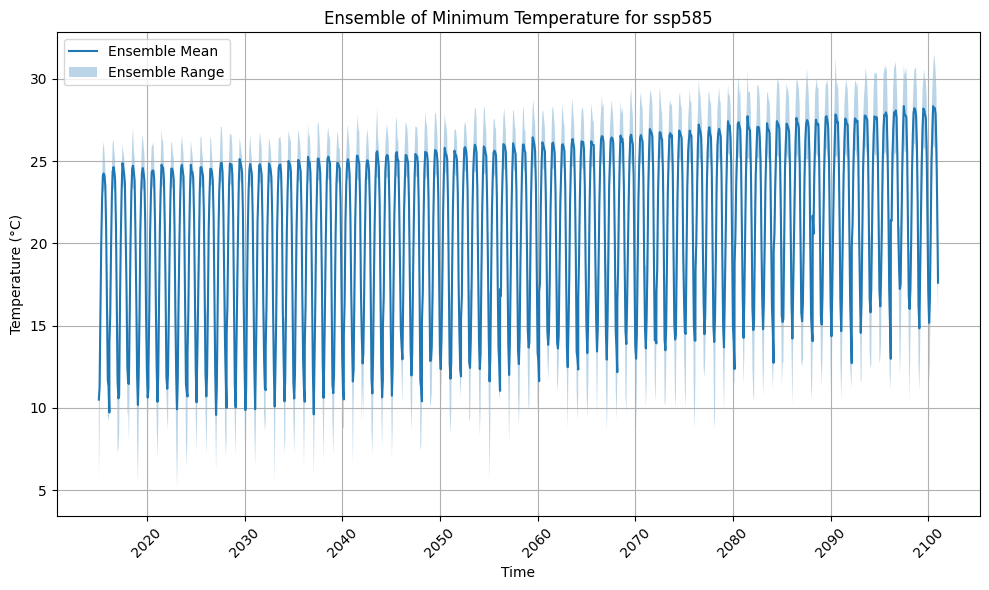

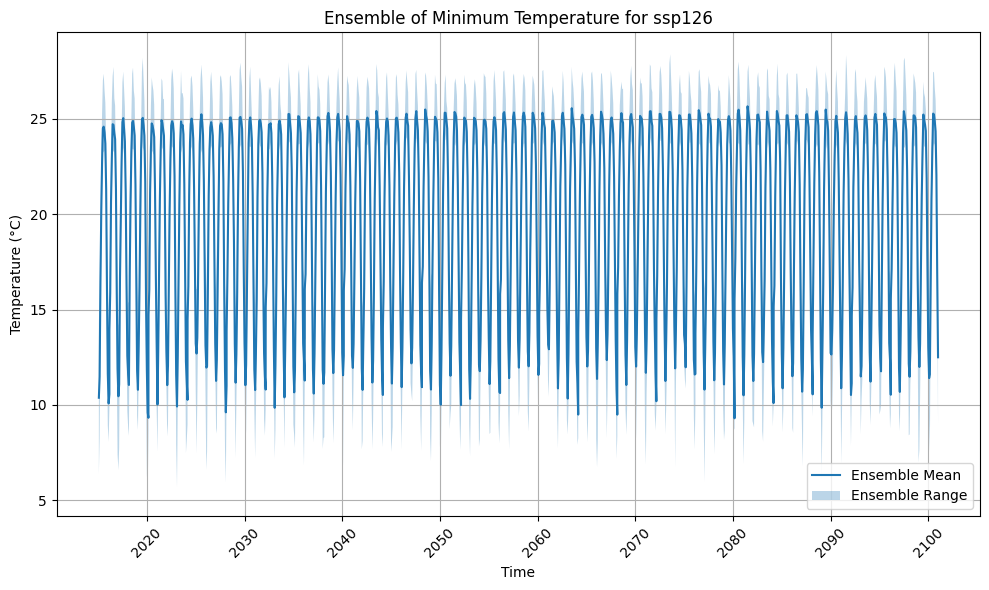

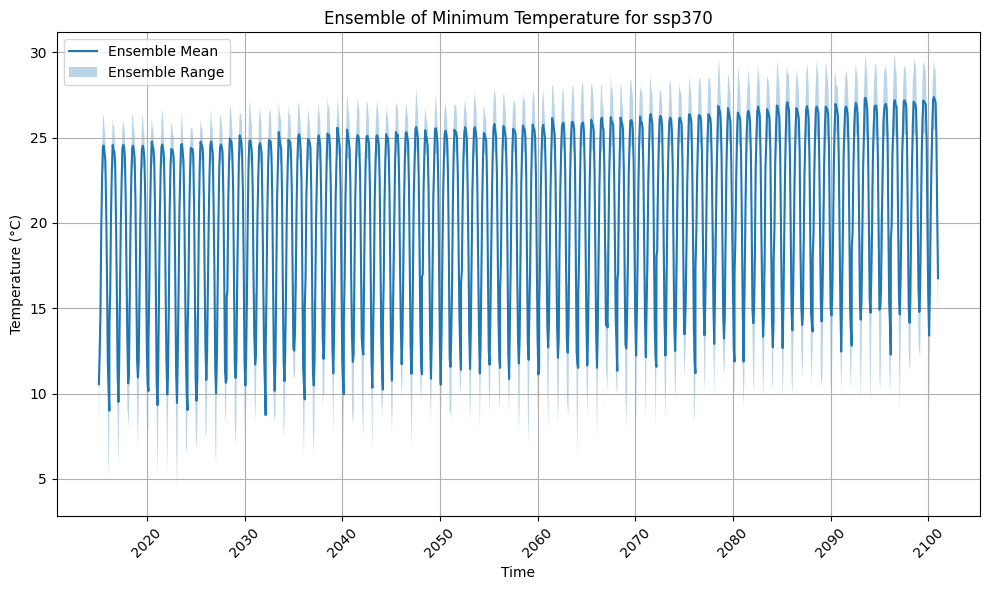

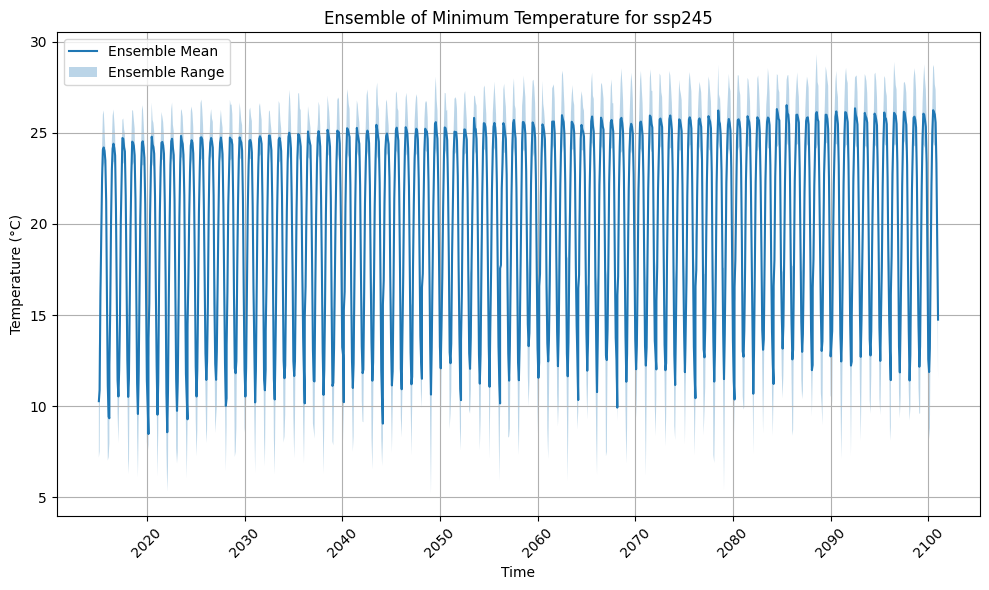

In [ ]:
# prompt: Visualize the ensemble results

import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Loop through each experiment and plot the ensemble mean
for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)  # Read with the first column as index

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(df_ensemble.index, df_ensemble['ensemble_mean'], label='Ensemble Mean')
        plt.fill_between(df_ensemble.index, df_ensemble['ensemble_min'], df_ensemble['ensemble_max'], alpha=0.3, label='Ensemble Range')
        plt.xlabel('Time')
        plt.ylabel('Temperature (°C)')
        plt.title(f'Ensemble of Minimum Temperature for {experiment_id}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.tight_layout()  # Adjust layout to prevent labels from overlapping
        plt.show()
    else:
        print(f"File not found: {file_path}")


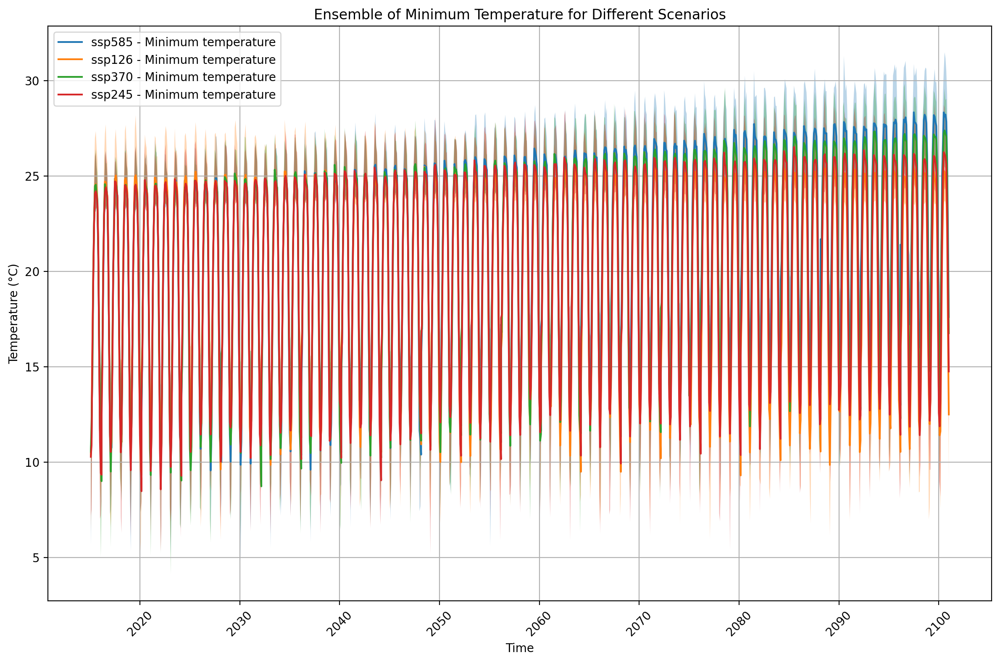

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create a single figure and axes
plt.figure(figsize=(12, 8))  # Adjust figure size as needed
ax = plt.gca()  # Get current axes

# Loop through each experiment and plot on the same axes
for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)

        # Plotting on the same axes
        ax.plot(df_ensemble.index, df_ensemble['ensemble_mean'], label=f'{experiment_id} - Minimum temperature')
        ax.fill_between(df_ensemble.index, df_ensemble['ensemble_min'], df_ensemble['ensemble_max'], alpha=0.3)  # No need to label fill_between again

    else:
        print(f"File not found: {file_path}")

# Set plot labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Ensemble of Minimum Temperature for Different Scenarios')

# Add legend and grid
ax.legend()
ax.grid(True)

# Rotate x-axis labels and adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-22-b42b2ffb42cf>:24: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-22-b42b2ffb42cf>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()
<ipython-input-22-b42b2ffb42cf>:24: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-22-b42b2ffb42cf>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()
<ipython-input-22-b42b2ffb42cf>:24: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_of_max = df_ensemble['ensemble_m

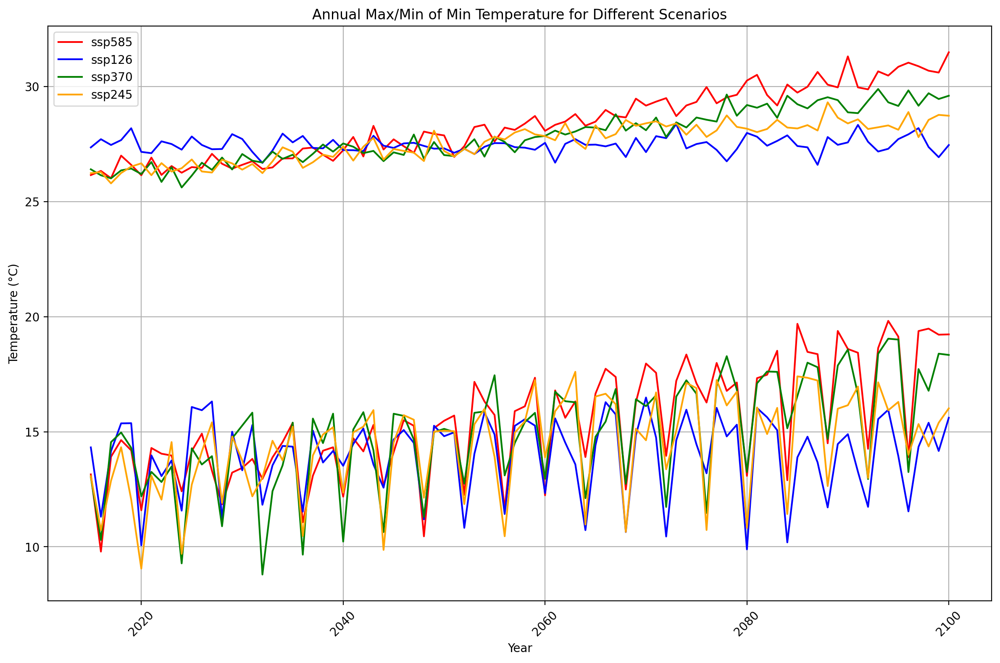

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/tasmin"

# Define the experiment IDs and corresponding colors
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
colors = ['red', 'blue', 'green', 'orange']  # Assign colors to each experiment ID

# Create a single figure and axes
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Loop through each experiment and plot on the same axes
for experiment_id, color in zip(experiment_ids, colors):
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean of min_temperatures.xlsx")

    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)

        # Calculate annual maximum of the ensemble maximum and minimum of the ensemble maximum
        annual_max_of_max = df_ensemble['ensemble_max'].resample('Y').max()
        annual_min_of_max = df_ensemble['ensemble_max'].resample('Y').min()

        # Plotting on the same axes with specified color
        ax.plot(annual_max_of_max.index.year, annual_max_of_max.values, label=f'{experiment_id}', color=color)
        ax.plot(annual_min_of_max.index.year, annual_min_of_max.values, color=color)

    else:
        print(f"File not found: {file_path}")

# Set plot labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Temperature (°C)')
ax.set_title('Annual Max/Min of Min Temperature for Different Scenarios')

# Add legend and grid
ax.legend()
ax.grid(True)

# Rotate x-axis labels and adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-10-295911cfafb7>:8: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_data = df_ensemble.resample('A').mean()


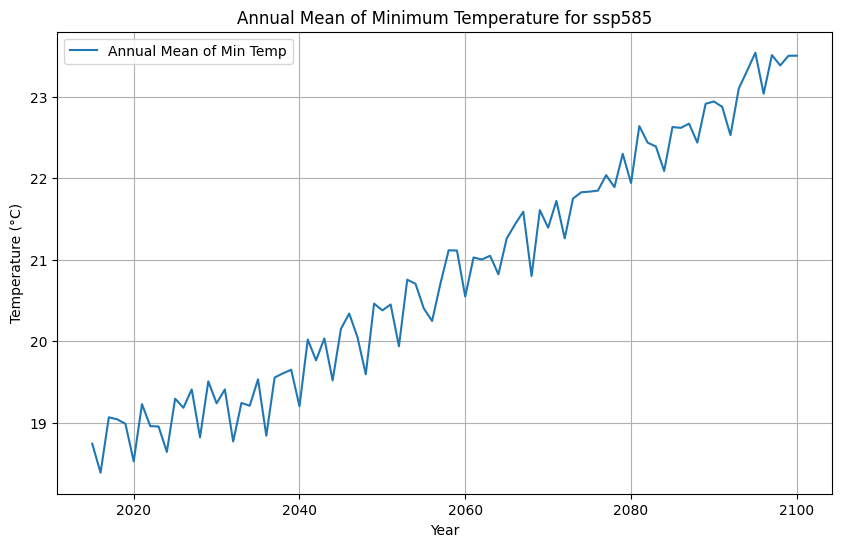

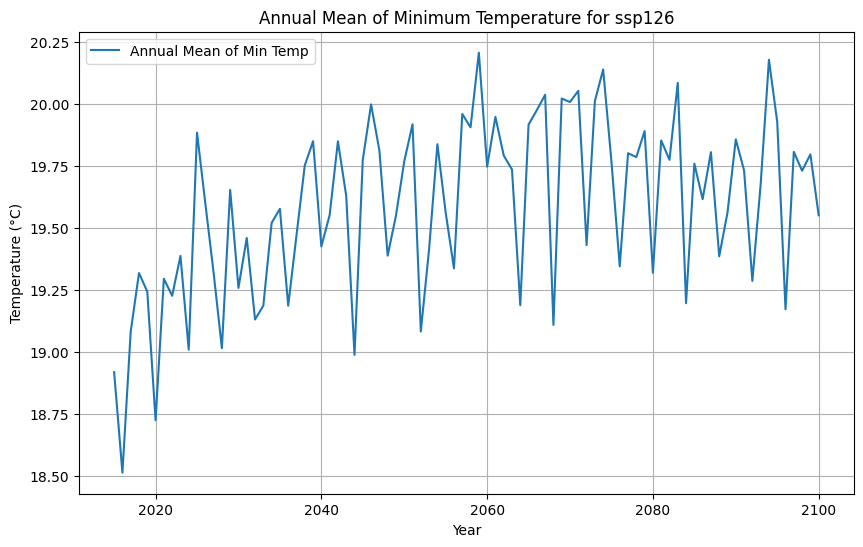

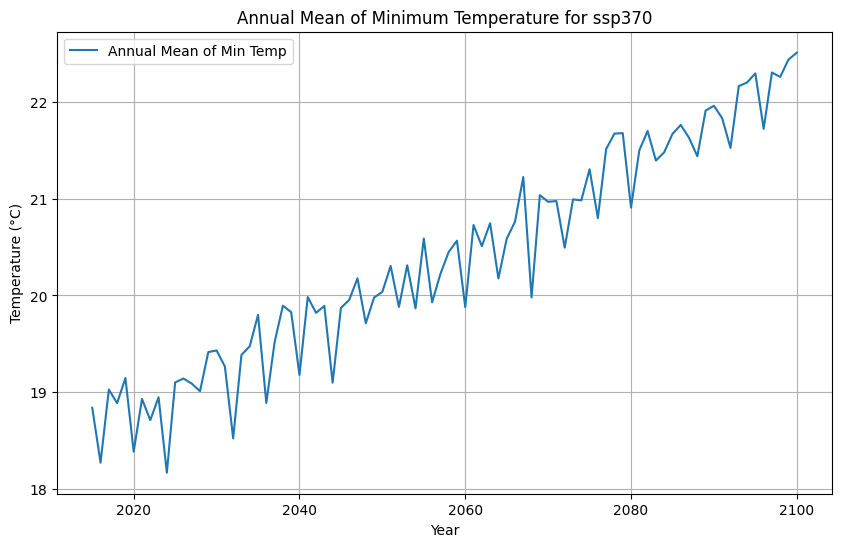

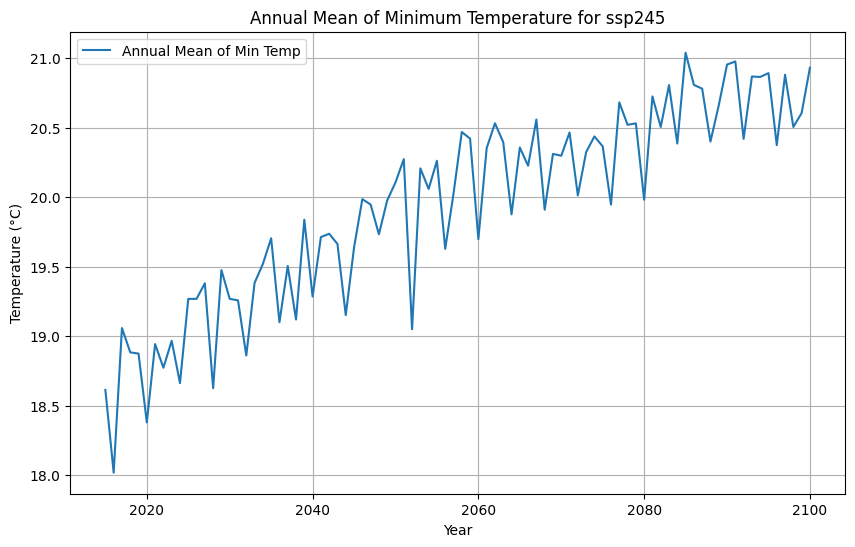

In [ ]:
# prompt: plot annual mean of min temperature

import matplotlib.pyplot as plt
# Calculate annual mean of minimum temperature
annual_stats = {}
for experiment_id, df_ensemble in ensemble_results.items():
    # Resample to annual frequency and calculate the mean
    annual_data = df_ensemble.resample('A').mean()
    annual_stats[experiment_id] = annual_data

# Plotting
for experiment_id, annual_data in annual_stats.items():
    plt.figure(figsize=(10, 6))
    plt.plot(annual_data.index.year, annual_data['ensemble_mean'], label='Annual Mean of Min Temp')
    plt.xlabel('Year')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Annual Mean of Minimum Temperature for {experiment_id}')
    plt.legend()
    plt.grid(True)
    plt.show()


# Rainfall

In [ ]:
df_ta = df.query("table_id == 'day' & variable_id == 'pr' & member_id == 'r1i1p1f1'")
df_ta

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
42,HighResMIP,MOHC,HadGEM3-GC31-MM,highresSST-present,r1i1p1f1,day,pr,gn,gs://cmip6/CMIP6/HighResMIP/MOHC/HadGEM3-GC31-...,NaN,20170818
80,HighResMIP,MOHC,HadGEM3-GC31-HM,highresSST-present,r1i1p1f1,day,pr,gn,gs://cmip6/CMIP6/HighResMIP/MOHC/HadGEM3-GC31-...,NaN,20170831
136,HighResMIP,MOHC,HadGEM3-GC31-LM,highresSST-present,r1i1p1f1,day,pr,gn,gs://cmip6/CMIP6/HighResMIP/MOHC/HadGEM3-GC31-...,NaN,20170906
156,HighResMIP,ECMWF,ECMWF-IFS-HR,control-1950,r1i1p1f1,day,pr,gr,gs://cmip6/CMIP6/HighResMIP/ECMWF/ECMWF-IFS-HR...,NaN,20170915
168,HighResMIP,ECMWF,ECMWF-IFS-HR,hist-1950,r1i1p1f1,day,pr,gr,gs://cmip6/CMIP6/HighResMIP/ECMWF/ECMWF-IFS-HR...,NaN,20170915
...,...,...,...,...,...,...,...,...,...,...,...
516324,ScenarioMIP,CSIRO-ARCCSS,ACCESS-CM2,ssp126,r1i1p1f1,day,pr,gn,gs://cmip6/CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCE...,NaN,20210317
517313,ScenarioMIP,CSIRO,ACCESS-ESM1-5,ssp585,r1i1p1f1,day,pr,gn,gs://cmip6/CMIP6/ScenarioMIP/CSIRO/ACCESS-ESM1...,NaN,20210318
520426,CMIP,EC-Earth-Consortium,EC-Earth3-CC,1pctCO2,r1i1p1f1,day,pr,gr,gs://cmip6/CMIP6/CMIP/EC-Earth-Consortium/EC-E...,NaN,20210525
522427,CMIP,E3SM-Project,E3SM-1-0,1pctCO2,r1i1p1f1,day,pr,gr,gs://cmip6/CMIP6/CMIP/E3SM-Project/E3SM-1-0/1p...,NaN,20210709


In [ ]:
import pandas as pd
import numpy as np
import xarray as xr
import gcsfs  # Required for Google Cloud Storage

# Define the latitude and longitude range for Bangladesh
lat_range = slice(20.5, 27)
lon_range = slice(88, 93)

# Initialize GCS file system
gcs = gcsfs.GCSFileSystem(token="anon")  # Anonymous access to CMIP6

def download_and_save_data(df_ta, experiment_id, source_id):
    # Filter the DataFrame for the given experiment_id and source_id
    df_ta_filtered = df_ta.query(f"member_id == 'r1i1p1f1' & source_id == '{source_id}' & experiment_id == '{experiment_id}'")

    # Create an empty list to store results
    temperature_data = []

    # Iterate over each row in df_ta_filtered
    for _, row in df_ta_filtered.iterrows():
        zstore = row['zstore']

        try:
            # Open dataset from Google Cloud Storage using gcsfs
            ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)

            # Select temperature variable (assuming it's 'tas' or 'ta')
            temp_var = 'pr' if 'pr' in ds else 'ta'
            ds_temp = ds[temp_var]

            # Select Bangladesh region
            ds_temp = ds_temp.sel(lat=lat_range, lon=lon_range)
            ds_temp = ds_temp * 86400
            # Convert Kelvin to Celsius if needed
            # if ds_temp.attrs.get('units', '') == 'K':


            # Compute area-weighted average
            weights = np.cos(np.deg2rad(ds_temp.lat))
            ds_weighted = ds_temp.weighted(weights)

            # Compute monthly mean
            ds_monthly_avg = ds_weighted.mean(dim=['lat', 'lon']).resample(time='1M').mean()

            # Convert to DataFrame and store results
            df_temp = ds_monthly_avg.to_dataframe().reset_index()
            df_temp['source_id'] = source_id
            temperature_data.append(df_temp)

        except Exception as e:
            print(f"Error processing {zstore}: {e}")

    # Ensure the list is not empty before concatenation
    if temperature_data:
        df_monthly_temperature = pd.concat(temperature_data, ignore_index=True)

        # Save the DataFrame to an Excel file
        output_file = f"/content/drive/MyDrive/CCRM TP/pr/{experiment_id}_{source_id}_monthly_rainfall.xlsx"
        try:
            with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
                df_monthly_temperature.to_excel(writer, sheet_name='Monthly Rainfall', index=False)
            print(f"DataFrame successfully saved to {output_file}")
        except Exception as e:
            print(f"An error occurred while saving {output_file}: {e}")
    else:
        print(f"No valid data was extracted for {experiment_id} and {source_id}.")

# Define the combinations of experiment_id and source_id to process
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['BCC-CSM2-MR', 'INM-CM5-0', 'MIROC-ES2L', 'IPSL-CM6A-LR']

# Loop through each combination and process the data
for experiment_id in experiment_ids:
    for source_id in source_ids:
        download_and_save_data(df_ta, experiment_id, source_id)

<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp585_BCC-CSM2-MR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp585_INM-CM5-0_monthly_rainfall.xlsx
No valid data was extracted for ssp585 and MIROC-ES2L.


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp585_IPSL-CM6A-LR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp126_BCC-CSM2-MR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp126_INM-CM5-0_monthly_rainfall.xlsx
No valid data was extracted for ssp126 and MIROC-ES2L.


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp126_IPSL-CM6A-LR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp370_BCC-CSM2-MR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp370_INM-CM5-0_monthly_rainfall.xlsx
No valid data was extracted for ssp370 and MIROC-ES2L.


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp370_IPSL-CM6A-LR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp245_BCC-CSM2-MR_monthly_rainfall.xlsx


<string>:7: FutureWarning: 'M' is deprecated and will be removed in a future version. Please use 'ME' instead of 'M'.


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp245_INM-CM5-0_monthly_rainfall.xlsx
No valid data was extracted for ssp245 and MIROC-ES2L.


/usr/local/lib/python3.11/dist-packages/xarray/groupers.py:487: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  self.index_grouper = pd.Grouper(


DataFrame successfully saved to /content/drive/MyDrive/CCRM TP/pr/ssp245_IPSL-CM6A-LR_monthly_rainfall.xlsx


In [ ]:
pip install cftime

In [ ]:

import pandas as pd
import numpy as np
import os
import cftime
# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/pr/"

# Define the experiment IDs and source IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['BCC-CSM2-MR', 'INM-CM5-0', 'IPSL-CM6A-LR']

# Create an empty dictionary to store dataframes for each experiment
ensemble_data = {exp: [] for exp in experiment_ids}

# Load data for each experiment and source
for experiment_id in experiment_ids:
    for source_id in source_ids:
        file_path = os.path.join(data_dir, f"{experiment_id}_{source_id}_monthly_rainfall.xlsx")

        if os.path.exists(file_path):
            df = pd.read_excel(file_path)

            # Explicitly select time and temperature columns
            time_col = df.columns[0]  # First column (time)
            temp_col = df.columns[1]  # Third column (tasmax)

            # Ensure 'time' is in datetime format
            df[time_col] = pd.to_datetime(df[time_col])

            # Set 'time' as the index
            df.set_index(time_col, inplace=True)

            # Convert temperature column to numeric, coercing errors to NaN
            df[temp_col] = pd.to_numeric(df[temp_col], errors='coerce')

            # Drop rows with NaN values (optional, depending on your use case)
            df.dropna(inplace=True)

            # Append the cleaned dataframe to the list
            ensemble_data[experiment_id].append(df[temp_col])  # Only append the temperature column
        else:
            print(f"File not found: {file_path}")

# Function to calculate the ensemble mean
def calculate_ensemble_mean(dataframes):
    # Concatenate all dataframes along the columns
    combined = pd.concat(dataframes, axis=1)

    # Calculate the mean across all models for each time step
    ensemble_mean = combined.mean(axis=1)

    # Calculate ensemble statistics (optional)
    ensemble_std = combined.std(axis=1)  # Standard deviation
    ensemble_min = combined.min(axis=1)  # Minimum
    ensemble_max = combined.max(axis=1)  # Maximum

    # Return as a DataFrame
    return pd.DataFrame({
        'ensemble_mean': ensemble_mean,
        'ensemble_std': ensemble_std,
        'ensemble_min': ensemble_min,
        'ensemble_max': ensemble_max
    })

# Calculate ensemble mean for each experiment
ensemble_results = {}
for experiment_id, dataframes in ensemble_data.items():
    if dataframes:  # Check if there are dataframes for this experiment
        ensemble_results[experiment_id] = calculate_ensemble_mean(dataframes)

# Save ensemble results to Excel files
for experiment_id, df_ensemble in ensemble_results.items():
    output_file = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_rainfall.xlsx")
    df_ensemble.to_excel(output_file, index=True)
    print(f"Ensemble results for {experiment_id} saved to {output_file}")

Ensemble results for ssp585 saved to /content/drive/MyDrive/CCRM TP/pr/ssp585_ensemble_mean_rainfall.xlsx
Ensemble results for ssp126 saved to /content/drive/MyDrive/CCRM TP/pr/ssp126_ensemble_mean_rainfall.xlsx
Ensemble results for ssp370 saved to /content/drive/MyDrive/CCRM TP/pr/ssp370_ensemble_mean_rainfall.xlsx
Ensemble results for ssp245 saved to /content/drive/MyDrive/CCRM TP/pr/ssp245_ensemble_mean_rainfall.xlsx


<ipython-input-18-b05672e8bac6>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_rainfall = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-18-b05672e8bac6>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_rainfall = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-18-b05672e8bac6>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_rainfall = df_ensemble['ensemble_max'].resample('Y').max()
<ipython-input-18-b05672e8bac6>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_rainfall = df_ensemble['ensemble_max'].resample('Y').max()


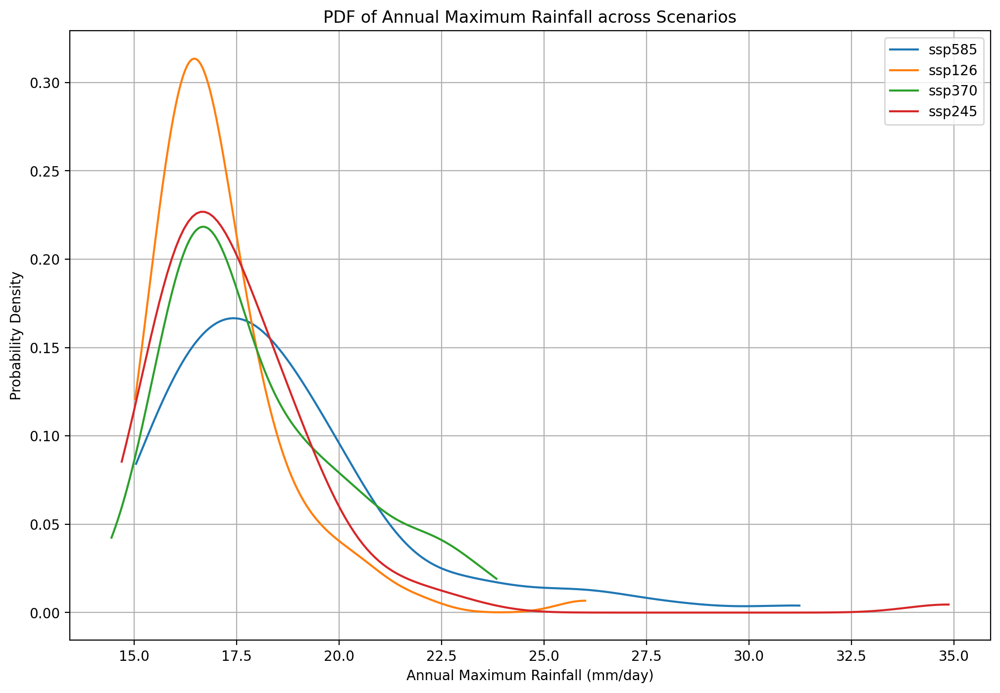

In [ ]:
# prompt: pdf curve of rainfall accross scenarios in a single plot

import pandas as pd
import matplotlib.pyplot as plt
import os
import scipy.stats as stats
import numpy as np

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/pr/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create the plot
plt.figure(figsize=(12, 8))

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_rainfall.xlsx")
    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual maximum rainfall
        annual_max_rainfall = df_ensemble['ensemble_max'].resample('Y').max()

        # Fit a kernel density estimate (KDE)
        density = stats.gaussian_kde(annual_max_rainfall)
        x_values = np.linspace(annual_max_rainfall.min(), annual_max_rainfall.max(), 200)
        y_values = density(x_values)

        # Plot the KDE
        plt.plot(x_values, y_values, label=experiment_id)

plt.xlabel('Annual Maximum Rainfall (mm/day)')
plt.ylabel('Probability Density')
plt.title('PDF of Annual Maximum Rainfall across Scenarios')
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-24-91a3cafdfebd>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_total_rainfall = df_ensemble['ensemble_mean'].resample('Y').sum() * 30
<ipython-input-24-91a3cafdfebd>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_total_rainfall = df_ensemble['ensemble_mean'].resample('Y').sum() * 30
<ipython-input-24-91a3cafdfebd>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_total_rainfall = df_ensemble['ensemble_mean'].resample('Y').sum() * 30
<ipython-input-24-91a3cafdfebd>:22: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_total_rainfall = df_ensemble['ensemble_mean'].resample('Y').sum() * 30


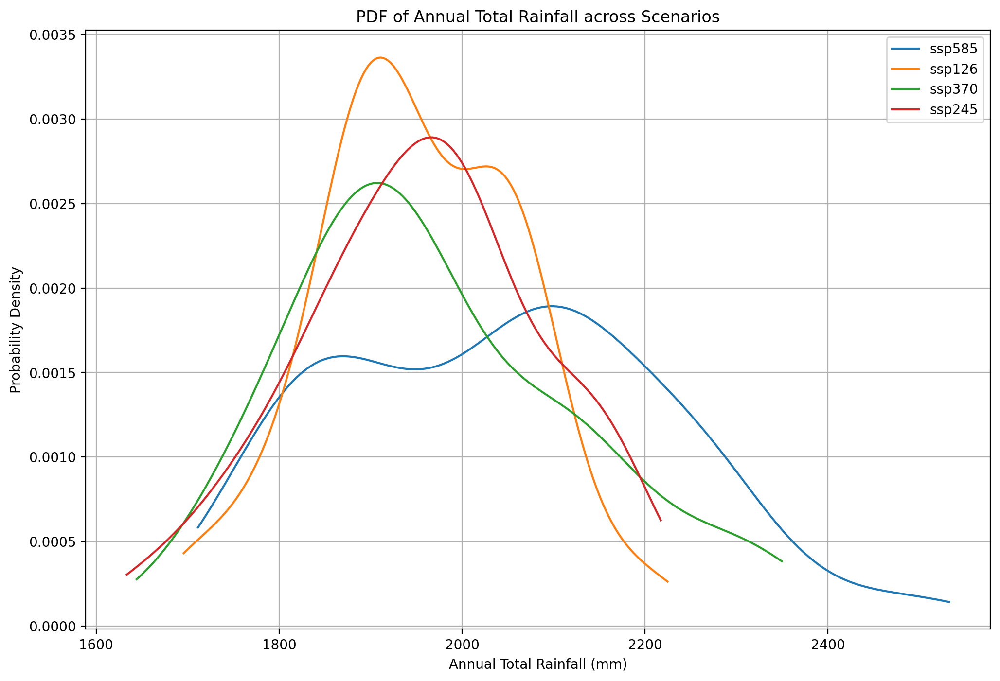

In [ ]:
# prompt: pdf curve of annual total rainfall

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/pr/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create the plot
plt.figure(figsize=(12, 8))

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_rainfall.xlsx")
    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual total rainfall
        annual_total_rainfall = df_ensemble['ensemble_mean'].resample('Y').sum() * 30

        # Fit a kernel density estimate (KDE)
        density = stats.gaussian_kde(annual_total_rainfall)
        x_values = np.linspace(annual_total_rainfall.min(), annual_total_rainfall.max(), 200)
        y_values = density(x_values)

        # Plot the KDE
        plt.plot(x_values, y_values, label=experiment_id)

plt.xlabel('Annual Total Rainfall (mm)')
plt.ylabel('Probability Density')
plt.title('PDF of Annual Total Rainfall across Scenarios')
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-28-56dfa1893206>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_consecutive_days = df_ensemble['ensemble_max'].resample('Y').max() # Placeholder
<ipython-input-28-56dfa1893206>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_consecutive_days = df_ensemble['ensemble_max'].resample('Y').max() # Placeholder
<ipython-input-28-56dfa1893206>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_consecutive_days = df_ensemble['ensemble_max'].resample('Y').max() # Placeholder
<ipython-input-28-56dfa1893206>:25: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_max_consecutive_days = df_ensemble['ensemble_max'].resample('Y').max() # Placeholder


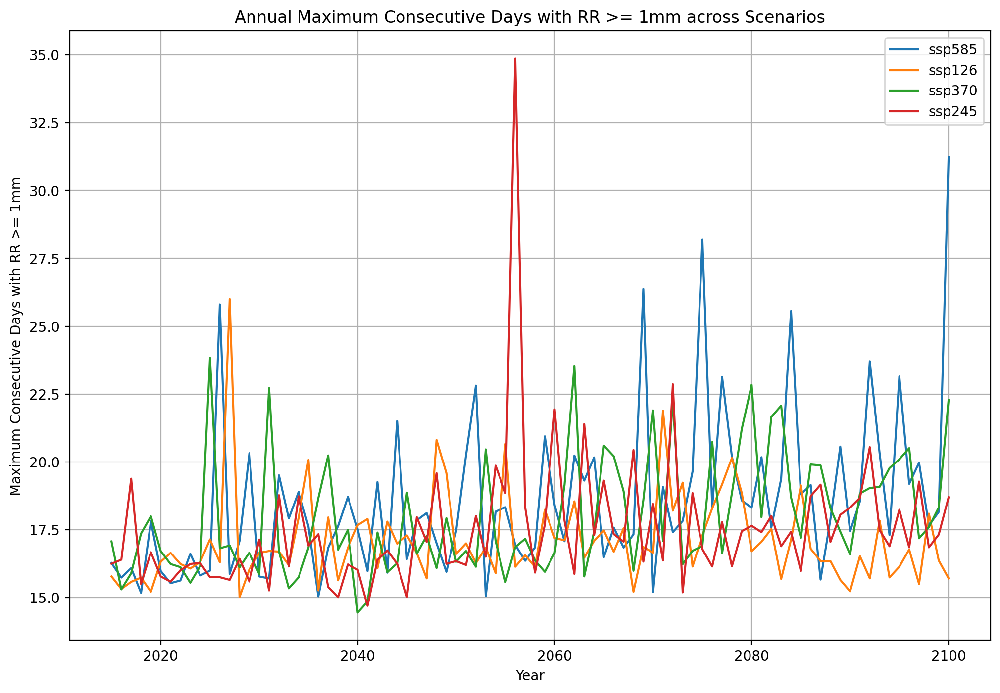

In [ ]:
# prompt: Plot of  annual Maximum number of consecutive days with RR>=1mm

import pandas as pd
import matplotlib.pyplot as plt
import os

# Define the directory where the Excel files are stored
data_dir = "/content/drive/MyDrive/CCRM TP/pr/"

# Define the experiment IDs
experiment_ids = ['ssp585', 'ssp126', 'ssp370', 'ssp245']

# Create the plot
plt.figure(figsize=(12, 8))

for experiment_id in experiment_ids:
    file_path = os.path.join(data_dir, f"{experiment_id}_ensemble_mean_rainfall.xlsx")
    if os.path.exists(file_path):
        df_ensemble = pd.read_excel(file_path, index_col=0)
        df_ensemble.index = pd.to_datetime(df_ensemble.index)

        # Calculate annual maximum of consecutive days with RR >= 1mm
        # This part needs the actual rainfall data (not just ensemble mean) and a proper algorithm
        # Placeholder: Replace this with your actual calculation
        annual_max_consecutive_days = df_ensemble['ensemble_max'].resample('Y').max() # Placeholder

        plt.plot(annual_max_consecutive_days.index.year, annual_max_consecutive_days.values, label=experiment_id)

plt.xlabel('Year')
plt.ylabel('Maximum Consecutive Days with RR >= 1mm')
plt.title('Annual Maximum Consecutive Days with RR >= 1mm across Scenarios')
plt.legend()
plt.grid(True)
plt.show()


# Multi model ensemble for Variation in Global,Regional(SAS) and Local(Bangladesh) analysis

In [ ]:
import pandas as pd
import numpy as np
import xarray as xr
import gcsfs

# Define regions
regions = {
    "Global": {"lat": slice(-90, 90), "lon": slice(0, 360)},
    "South_Asia": {"lat": slice(5, 35), "lon": slice(65, 95)},
    "Bangladesh": {"lat": slice(20.5, 27), "lon": slice(88, 93)},
}

# Initialize GCS file system
gcs = gcsfs.GCSFileSystem(token="anon")

def process_data(df_ta, experiment_id, source_id):
    """Process data for a given experiment_id and source_id."""
    df_ta_filtered = df_ta.query(
        f"member_id == 'r1i1p1f1' & source_id == '{source_id}' & experiment_id == '{experiment_id}'"
    )
    region_data = {region: [] for region in regions}

    for _, row in df_ta_filtered.iterrows():
        zstore = row['zstore']
        try:
            ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)
            temp_var = 'tas' if 'tas' in ds else 'ta'
            ds_temp = ds[temp_var]

            for region, coords in regions.items():
                ds_region = ds_temp.sel(lat=coords["lat"], lon=coords["lon"])
                if ds_region.attrs.get('units', '') == 'K':
                    ds_region = ds_region - 273.15  # Convert K to °C

                # Compute area-weighted average
                weights = np.cos(np.deg2rad(ds_region.lat))
                ds_weighted = ds_region.weighted(weights)
                ds_monthly_avg = ds_weighted.mean(dim=['lat', 'lon']).resample(time='1ME').mean()

                df_temp = ds_monthly_avg.to_dataframe().reset_index()
                df_temp = df_temp.rename(columns={temp_var: 'temperature'})
                df_temp['region'] = region
                df_temp['source_id'] = source_id
                df_temp['experiment_id'] = experiment_id  # Add experiment_id
                region_data[region].append(df_temp)

        except Exception as e:
            print(f"Error processing {zstore}: {e}")

    combined_data = []
    for region, data in region_data.items():
        if data:
            df_region = pd.concat(data, ignore_index=True)
            combined_data.append(df_region)

    return pd.concat(combined_data, ignore_index=True) if combined_data else None

# Define experiments and models
experiment_ids = ['historical','ssp585', 'ssp126', 'ssp370', 'ssp245']
source_ids = ['INM-CM4-8', 'INM-CM5-0', 'ACCESS-CM2', 'IPSL-CM6A-LR']

# Process data for all combinations
all_data = pd.DataFrame()
for experiment_id in experiment_ids:
    for source_id in source_ids:
        print(f"Processing {experiment_id} - {source_id}...")
        df_result = process_data(df_ta, experiment_id, source_id)
        if df_result is not None:
            all_data = pd.concat([all_data, df_result], ignore_index=True)

all_data['time'] = pd.to_datetime(all_data['time'].astype(str))

# Pivot and save
pivot_data = all_data.pivot_table(
    index='time',
    columns=['region', 'experiment_id'],
    values='temperature',
    aggfunc='mean'
)

# Generate full time range (1850-01 to 2100-12)
full_time_range = pd.date_range(start='2014-01-01', end='2100-12-31', freq='ME')
pivot_data = pivot_data.reindex(full_time_range)

# Flatten columns and save
pivot_data.columns = [f"{region}_{experiment}" for region, experiment in pivot_data.columns]
pivot_data.reset_index(inplace=True)
pivot_data.rename(columns={'index': 'time'}, inplace=True)

output_file = "/content/drive/MyDrive/CCRM TP/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
pivot_data.to_excel(output_file, index=False)
print(f"Data saved to {output_file}")

In [ ]:
import pandas as pd

# Load the intermediate CSV file
intermediate_file = "/content/drive/MyDrive/CCRM TP/intermediate_scenario_data.csv"
all_data = pd.read_csv(intermediate_file)

# Convert 'time' column to datetime (if not already)
all_data['time'] = pd.to_datetime(all_data['time'])

# Group by 'time', 'region', and 'experiment_id' and calculate the mean temperature
ensemble_data = all_data.groupby(['time', 'region', 'experiment_id'])['temperature'].mean().reset_index()

# Pivot the data to create the desired output format
# Columns: time, Global_historical, Global_ssp585, ..., Bangladesh_ssp245
pivot_data = ensemble_data.pivot_table(
    index='time',
    columns=['region', 'experiment_id'],
    values='temperature',
    aggfunc='mean'
)

# Flatten the multi-level columns
pivot_data.columns = [f"{region}_{experiment}" for region, experiment in pivot_data.columns]

# Reset index to make 'time' a column
pivot_data.reset_index(inplace=True)

# Save the final DataFrame to an Excel file
output_file = "/content/drive/MyDrive/CCRM TP/ensemble_global_south_asia_bangladesh.xlsx"
pivot_data.to_excel(output_file, index=False)
print(f"Ensemble data saved to {output_file}")

Ensemble data saved to /content/drive/MyDrive/CCRM TP/ensemble_global_south_asia_bangladesh.xlsx


In [ ]:
all_data['time'] = pd.to_datetime(all_data['time'].astype(str))

# Pivot and save
pivot_data = all_data.pivot_table(
    index='time',
    columns=['region', 'experiment_id'],
    values='temperature',
    aggfunc='mean'
)

# Generate full time range (1850-01 to 2100-12)
full_time_range = pd.date_range(start='2014-01-01', end='2100-12-31', freq='ME')
pivot_data = pivot_data.reindex(full_time_range)

# Flatten columns and save
pivot_data.columns = [f"{region}_{experiment}" for region, experiment in pivot_data.columns]
pivot_data.reset_index(inplace=True)
pivot_data.rename(columns={'index': 'time'}, inplace=True)

output_file = "/content/drive/MyDrive/CCRM TP/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
pivot_data.to_excel(output_file, index=False)
print(f"Data saved to {output_file}")

Data saved to /content/drive/MyDrive/CCRM TP/ensemble_global_south_asia_bangladesh.xlsx


In [ ]:
# Save the intermediate data to a file
intermediate_file = "/content/drive/MyDrive/CCRM TP/intermediate_scenario_data.csv"
all_data.to_csv(intermediate_file, index=False)
print(f"Intermediate data saved to {intermediate_file}")

Intermediate data saved to /content/drive/MyDrive/CCRM TP/intermediate_scenario_data.csv


In [ ]:
def process_data(df_ta, experiment_id, source_id):
    """
    Process data for a given experiment_id and source_id.
    Returns a DataFrame with monthly mean temperatures for all regions.
    """
    # Filter the DataFrame for the given experiment_id and source_id
    df_ta_filtered = df_ta.query(f"member_id == 'r1i1p1f1' & source_id == '{source_id}' & experiment_id == '{experiment_id}'")

    # Create an empty dictionary to store results for each region
    region_data = {region: [] for region in regions}

    # Iterate over each row in df_ta_filtered
    for _, row in df_ta_filtered.iterrows():
        zstore = row['zstore']

        try:
            # Open dataset from Google Cloud Storage using gcsfs
            ds = xr.open_zarr(f"gcs://{zstore}", storage_options={"token": "anon"}, consolidated=True)

            # Select temperature variable (assuming it's 'tas' or 'ta')
            temp_var = 'tas' if 'tas' in ds else 'ta'
            ds_temp = ds[temp_var]

            # Process data for each region
            for region, coords in regions.items():
                # Select region
                ds_region = ds_temp.sel(lat=coords["lat"], lon=coords["lon"])

                # Convert Kelvin to Celsius if needed
                if ds_region.attrs.get('units', '') == 'K':
                    ds_region = ds_region - 273.15

                # Compute area-weighted average
                weights = np.cos(np.deg2rad(ds_region.lat))
                ds_weighted = ds_region.weighted(weights)

                # Compute monthly mean
                ds_monthly_avg = ds_weighted.mean(dim=['lat', 'lon']).resample(time='1ME').mean()

                # Convert to DataFrame and store results
                df_temp = ds_monthly_avg.to_dataframe().reset_index()
                df_temp = df_temp.rename(columns={temp_var: 'temperature'})  # Rename the temperature column
                df_temp['region'] = region
                df_temp['source_id'] = source_id
                df_temp['experiment_id'] = experiment_id  # Add experiment_id column
                region_data[region].append(df_temp)

        except Exception as e:
            print(f"Error processing {zstore}: {e}")

    # Combine data for all regions
    combined_data = []
    for region, data in region_data.items():
        if data:  # Check if there is data for the region
            df_region = pd.concat(data, ignore_index=True)
            combined_data.append(df_region)

    if combined_data:
        return pd.concat(combined_data, ignore_index=True)
    else:
        return None

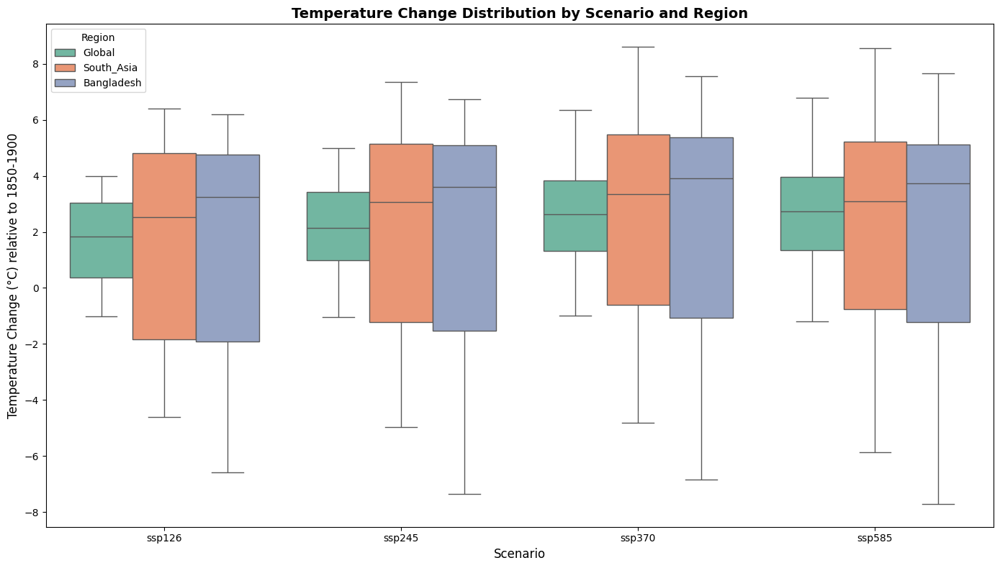

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the historical data
historical_file = "/content/ensemble_historical_global_south_asia_bangladesh.xlsx"
historical_data = pd.read_excel(historical_file)

# Load the scenario data
scenario_file = "/content/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
scenario_data = pd.read_excel(scenario_file)

# Convert 'time' column to datetime in both DataFrames
historical_data['time'] = pd.to_datetime(historical_data['time'], errors='coerce')
scenario_data['time'] = pd.to_datetime(scenario_data['time'], errors='coerce')

# Drop rows with invalid dates (NaT) if any
historical_data = historical_data.dropna(subset=['time'])
scenario_data = scenario_data.dropna(subset=['time'])

# Merge the historical and scenario data on 'time'
all_data = pd.merge(historical_data, scenario_data, on='time', how='outer')

# Calculate the baseline (1850-1900 average) using historical data only
baseline_columns = ['Global_historical', 'Bangladesh_historical', 'South_Asia_historical']
baseline = all_data[(all_data['time'].dt.year >= 1850) & (all_data['time'].dt.year <= 1900)][baseline_columns].mean()

# Calculate temperature change relative to the baseline
for column in all_data.columns:
    if column != 'time':
        if column in baseline_columns:
            # For historical data, subtract the historical baseline
            all_data[column] -= baseline[column]
        else:
            # For scenario data, subtract the corresponding historical baseline
            # Example: 'Global_ssp126' uses 'Global_historical' baseline
            baseline_column = column.replace('ssp126', 'historical').replace('ssp245', 'historical').replace('ssp370', 'historical').replace('ssp585', 'historical')
            if baseline_column in baseline:
                all_data[column] -= baseline[baseline_column]

# Prepare data for box plots
scenarios = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
regions = ['Global', 'South_Asia', 'Bangladesh']

# Create a DataFrame for box plots
box_data = pd.DataFrame()

for scenario in scenarios:
    for region in regions:
        column_name = f'{region}_{scenario}'
        if column_name in all_data.columns:
            temp_data = all_data[['time', column_name]].dropna()
            temp_data['Scenario'] = scenario
            temp_data['Region'] = region
            temp_data = temp_data.rename(columns={column_name: 'Temperature Change'})
            box_data = pd.concat([box_data, temp_data])

# Plot box plots
plt.figure(figsize=(14, 8))
sns.boxplot(x='Scenario', y='Temperature Change', hue='Region', data=box_data, palette='Set2')

# Add labels and title
plt.xlabel('Scenario', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Temperature Change Distribution by Scenario and Region', fontsize=14, fontweight='bold')

# Add a legend
plt.legend(title='Region', loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

<ipython-input-11-42d52ac1b27c>:14: UserWarning: The palette list has more values (12) than needed (3), which may not be intended.
  sns.boxplot(x='Scenario', y='Temperature Change', hue='Region', data=box_data,


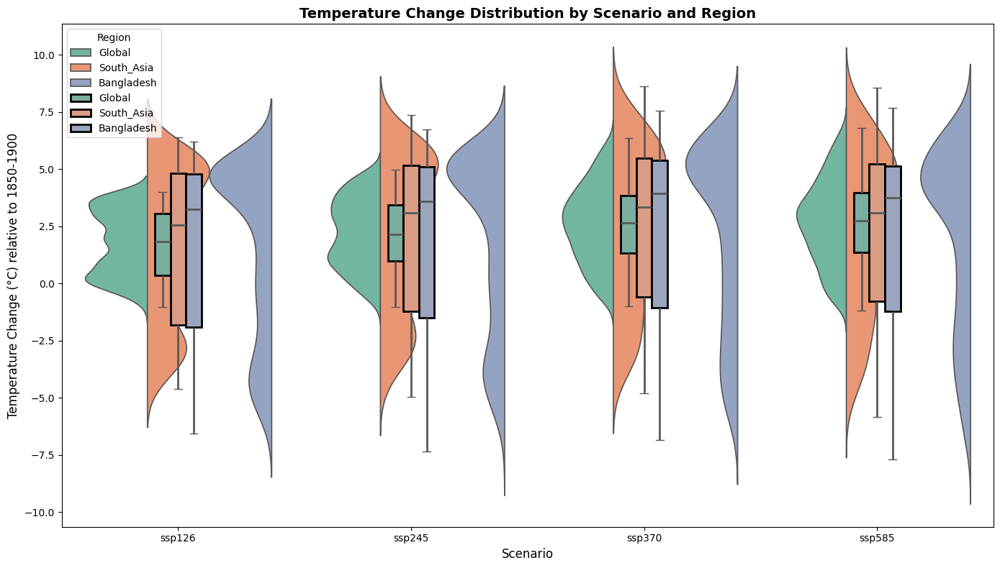

In [ ]:
plt.figure(figsize=(14, 8))

# Violin plot
violin_plot = sns.violinplot(x='Scenario', y='Temperature Change', hue='Region', data=box_data,
                             palette='Set2', split=True, width=.8, inner=None)

# Get the colors used in the violin plot
violin_colors = [c.get_facecolor().tolist() for c in violin_plot.collections]

# Flatten the list of colors (for split violins)
violin_colors = [item for sublist in violin_colors for item in sublist]

# Box plot with the same colors
sns.boxplot(x='Scenario', y='Temperature Change', hue='Region', data=box_data,
            showcaps=True, boxprops={'edgecolor':'black', 'linewidth':2},
            whiskerprops={'linewidth':2}, medianprops={'linewidth':2},
            showfliers=False, width=0.2, palette=violin_colors)  # Use palette=violin_colors

# Add labels and title
plt.xlabel('Scenario', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Temperature Change Distribution by Scenario and Region', fontsize=14, fontweight='bold')

# Add a legend
plt.legend(title='Region', loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

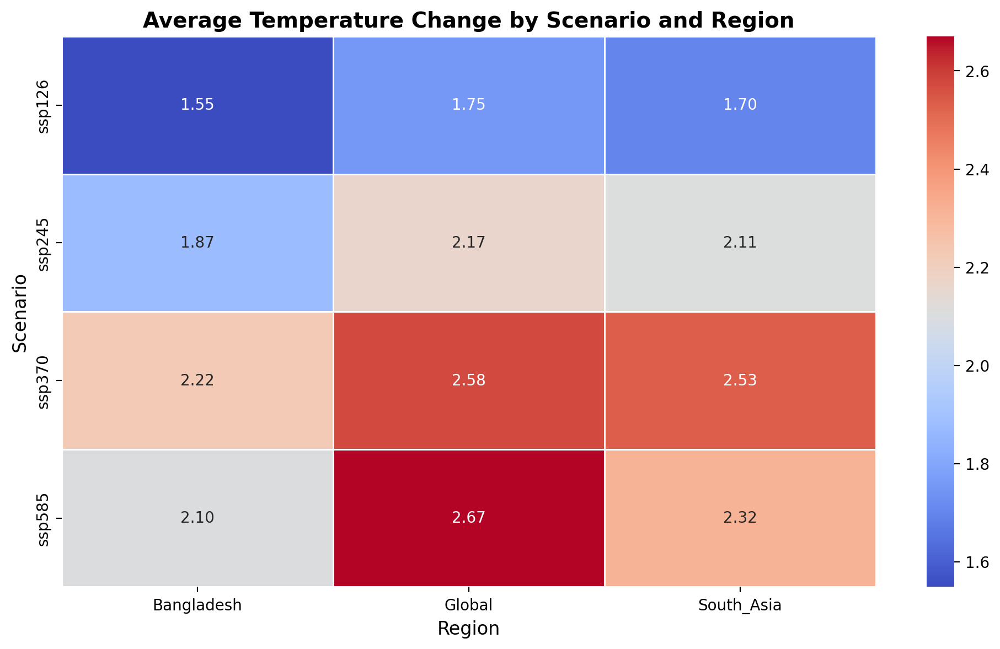

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the data for the heatmap
heatmap_data = box_data.groupby(['Scenario', 'Region'])['Temperature Change'].mean().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add labels and title
plt.xlabel('Region', fontsize=12)
plt.ylabel('Scenario', fontsize=12)
plt.title('Average Temperature Change by Scenario and Region', fontsize=14, fontweight='bold')

# Show the plot
plt.tight_layout()
plt.show()

<ipython-input-61-6a934dad7b36>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.lineplot(x='time', y='Temperature Change', hue='Region', style='Scenario', data=line_data, ci='sd', palette='Set2')


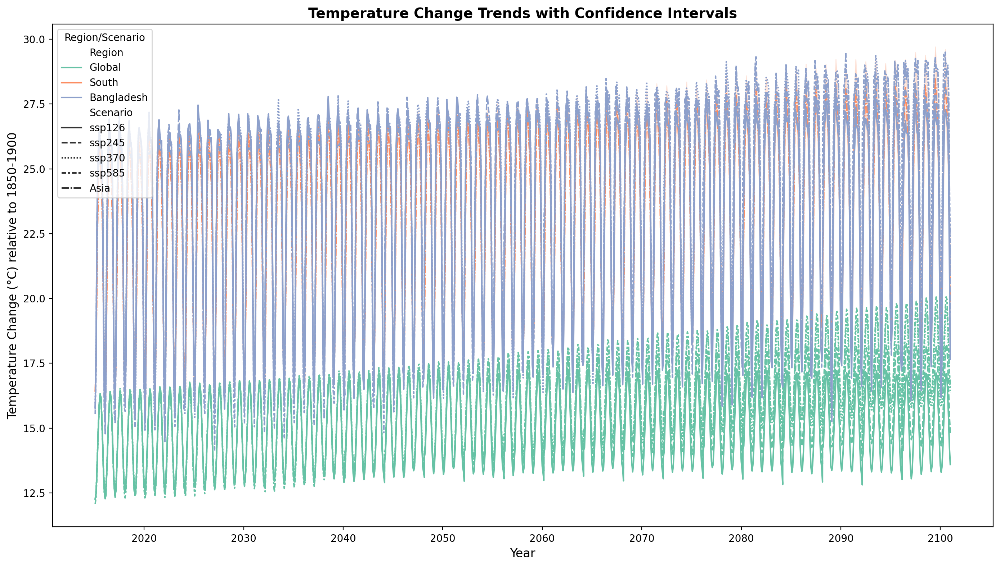

In [ ]:
# Group by time and scenario to calculate mean and confidence intervals
line_data = all_data.melt(id_vars=['time'], value_vars=[f'{region}_{scenario}' for region in regions for scenario in scenarios],
                          var_name='Scenario_Region', value_name='Temperature Change')

# Extract scenario and region from the combined column
line_data['Scenario'] = line_data['Scenario_Region'].apply(lambda x: x.split('_')[1])
line_data['Region'] = line_data['Scenario_Region'].apply(lambda x: x.split('_')[0])

# Plot line plots with confidence intervals
plt.figure(figsize=(14, 8))
sns.lineplot(x='time', y='Temperature Change', hue='Region', style='Scenario', data=line_data, ci='sd', palette='Set2')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Temperature Change Trends with Confidence Intervals', fontsize=14, fontweight='bold')

# Add a legend
plt.legend(title='Region/Scenario', loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()

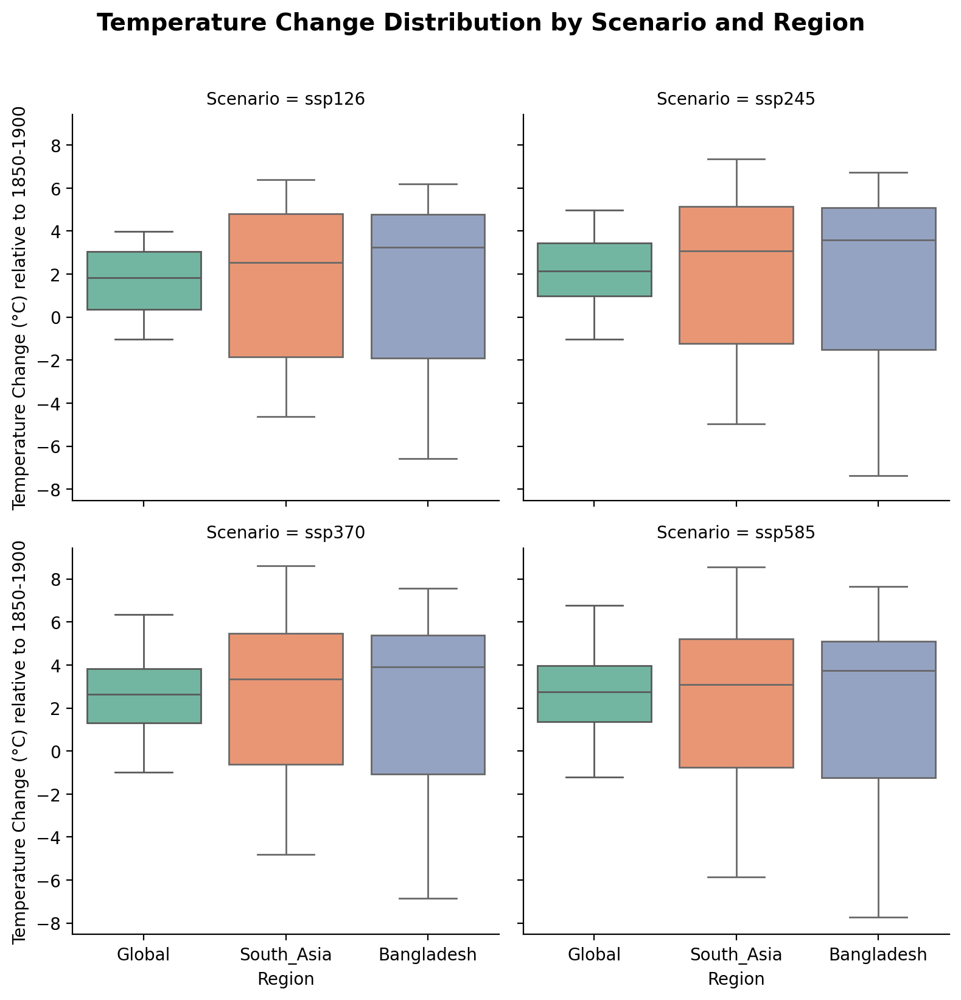

In [ ]:
# Plot faceted plots
g = sns.FacetGrid(box_data, col='Scenario', hue='Region', col_wrap=2, height=4, palette='Set2')
g.map(sns.boxplot, 'Region', 'Temperature Change', order=regions)

# Add labels and title
g.set_axis_labels('Region', 'Temperature Change (°C) relative to 1850-1900')
g.fig.suptitle('Temperature Change Distribution by Scenario and Region', fontsize=14, fontweight='bold', y=1.02)

# Show the plot
plt.tight_layout()
plt.show()

<Figure size 800x600 with 0 Axes>

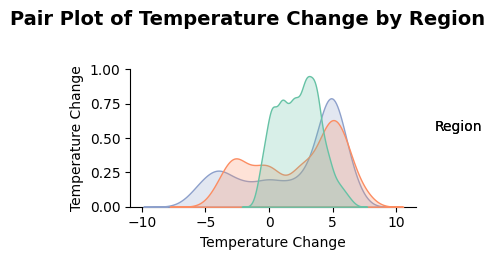

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set figure size
plt.figure(figsize=(8, 6))

# Create the pair plot
g = sns.pairplot(box_data, hue='Region', vars=['Temperature Change'], diag_kind='kde', palette='Set2')

# Add legend
g.add_legend()
g._legend.set_title('Region')

# Add title
plt.suptitle('Pair Plot of Temperature Change by Region', fontsize=14, fontweight='bold', y=1.02)

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-72-48c0967d8e39>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bangladesh_data['year'] = bangladesh_data['time'].dt.year


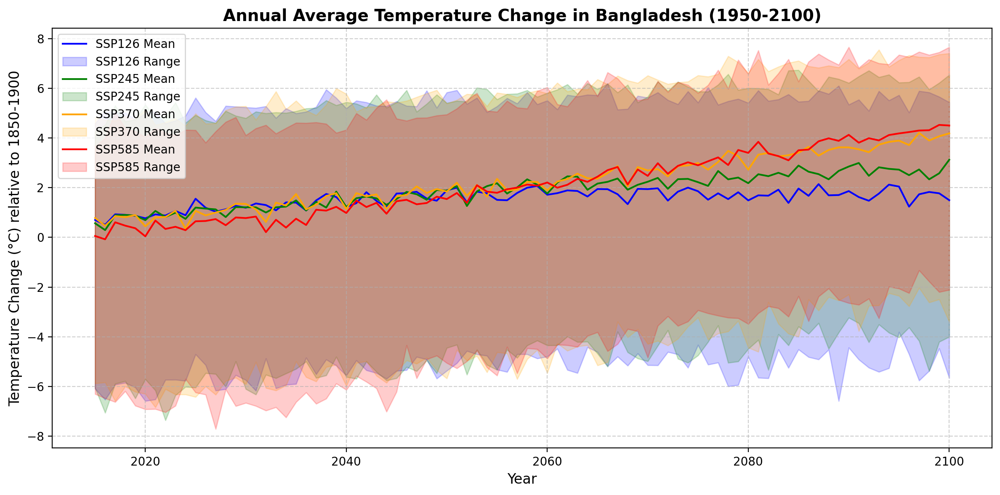

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the historical data
historical_file = "/content/ensemble_historical_global_south_asia_bangladesh.xlsx"
historical_data = pd.read_excel(historical_file)

# Load the scenario data
scenario_file = "/content/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
scenario_data = pd.read_excel(scenario_file)

# Convert 'time' column to datetime in both DataFrames
historical_data['time'] = pd.to_datetime(historical_data['time'], errors='coerce')
scenario_data['time'] = pd.to_datetime(scenario_data['time'], errors='coerce')

# Drop rows with invalid dates (NaT) if any
historical_data = historical_data.dropna(subset=['time'])
scenario_data = scenario_data.dropna(subset=['time'])

# Merge the historical and scenario data on 'time'
all_data = pd.merge(historical_data, scenario_data, on='time', how='outer')

# Calculate the baseline (1850-1900 average) for Bangladesh
baseline_bangladesh = all_data[(all_data['time'].dt.year >= 1850) & (all_data['time'].dt.year <= 1900)]['Bangladesh_historical'].mean()

# Calculate temperature change relative to the baseline for Bangladesh
for column in all_data.columns:
    if column.startswith('Bangladesh_'):
        all_data[column] -= baseline_bangladesh

# Filter data for Bangladesh and the time range 1950-2100
bangladesh_data = all_data[(all_data['time'].dt.year >= 1950) & (all_data['time'].dt.year <= 2100)]

# Extract year from the 'time' column
bangladesh_data['year'] = bangladesh_data['time'].dt.year

# Group by year and calculate annual averages, max, and min for each scenario
scenarios = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
annual_data = pd.DataFrame()

for scenario in scenarios:
    column_name = f'Bangladesh_{scenario}'
    if column_name in bangladesh_data.columns:
        scenario_data = bangladesh_data.groupby('year')[column_name].agg(['mean', 'min', 'max']).reset_index()
        scenario_data['Scenario'] = scenario
        annual_data = pd.concat([annual_data, scenario_data])

# Plot the data
plt.figure(figsize=(12, 6))

# Define colors for each scenario
colors = {'ssp126': 'blue', 'ssp245': 'green', 'ssp370': 'orange', 'ssp585': 'red'}

# Plot each scenario with shaded regions for max and min
for scenario in scenarios:
    if scenario in annual_data['Scenario'].unique():
        scenario_df = annual_data[annual_data['Scenario'] == scenario]
        plt.plot(scenario_df['year'], scenario_df['mean'], color=colors[scenario], label=f'{scenario.upper()} Mean')
        plt.fill_between(scenario_df['year'], scenario_df['min'], scenario_df['max'], color=colors[scenario], alpha=0.2, label=f'{scenario.upper()} Range')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Annual Average Temperature Change in Bangladesh (1950-2100)', fontsize=14, fontweight='bold')

# Add a legend
plt.legend(loc='upper left', fontsize=10)

# Add grid
plt.grid(True, linestyle='--', alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()

<ipython-input-18-8a9b08b2dcc7>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bangladesh_data['year'] = bangladesh_data['time'].dt.year


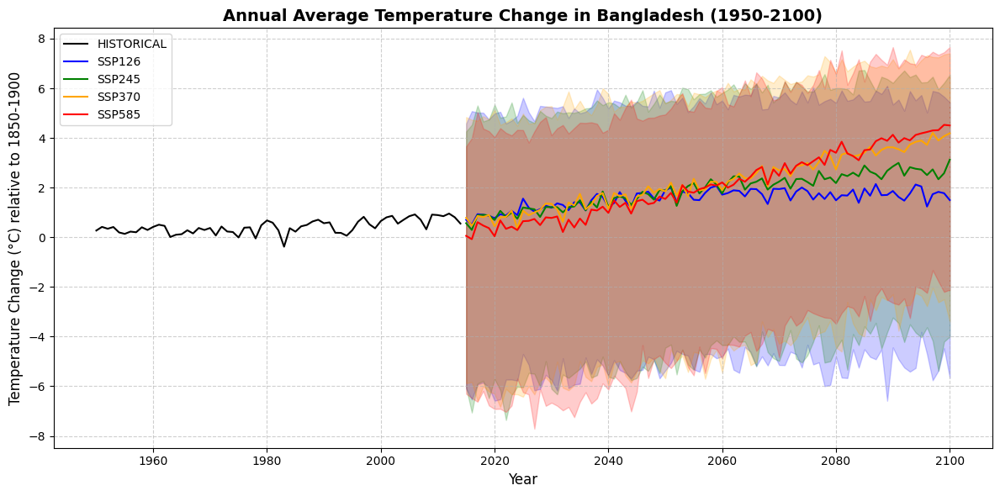

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the historical data
historical_file = "/content/ensemble_historical_global_south_asia_bangladesh.xlsx"
historical_data = pd.read_excel(historical_file)

# Load the scenario data
scenario_file = "/content/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
scenario_data = pd.read_excel(scenario_file)

# Convert 'time' column to datetime in both DataFrames
historical_data['time'] = pd.to_datetime(historical_data['time'], errors='coerce')
scenario_data['time'] = pd.to_datetime(scenario_data['time'], errors='coerce')

# Drop rows with invalid dates (NaT) if any
historical_data = historical_data.dropna(subset=['time'])
scenario_data = scenario_data.dropna(subset=['time'])

# Merge the historical and scenario data on 'time'
all_data = pd.merge(historical_data, scenario_data, on='time', how='outer')

# Calculate the baseline (1850-1900 average) for Bangladesh
baseline_bangladesh = all_data[(all_data['time'].dt.year >= 1850) & (all_data['time'].dt.year <= 1900)]['Bangladesh_historical'].mean()

# Calculate temperature change relative to the baseline for Bangladesh
for column in all_data.columns:
    if column.startswith('Bangladesh_'):
        all_data[column] -= baseline_bangladesh

# Filter data for Bangladesh and the time range 1950-2100
bangladesh_data = all_data[(all_data['time'].dt.year >= 1950) & (all_data['time'].dt.year <= 2100)]

# Extract year from the 'time' column
bangladesh_data['year'] = bangladesh_data['time'].dt.year

# Group by year and calculate annual averages, max, and min for each scenario
scenarios = ['historical', 'ssp126', 'ssp245', 'ssp370', 'ssp585']
annual_data = pd.DataFrame()

for scenario in scenarios:
    column_name = f'Bangladesh_{scenario}'
    if column_name in bangladesh_data.columns:
        scenario_data = bangladesh_data.groupby('year')[column_name].agg(['mean', 'min', 'max']).reset_index()
        scenario_data['Scenario'] = scenario
        annual_data = pd.concat([annual_data, scenario_data])

# Plot the data
plt.figure(figsize=(12, 6))

# Define colors for each scenario
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'green', 'ssp370': 'orange', 'ssp585': 'red'}

# Plot each scenario with shaded regions for max and min
for scenario in scenarios:
    if scenario in annual_data['Scenario'].unique():
        scenario_df = annual_data[annual_data['Scenario'] == scenario]
        plt.plot(scenario_df['year'], scenario_df['mean'], color=colors[scenario], label=f'{scenario.upper()}')
        if scenario != 'historical':  # Add shaded regions only for SSP scenarios
            plt.fill_between(scenario_df['year'], scenario_df['min'], scenario_df['max'], color=colors[scenario], alpha=0.2)

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Annual Average Temperature Change in Bangladesh (1950-2100)', fontsize=14, fontweight='bold')

# Add a legend (without the range)
plt.legend(loc='upper left', fontsize=10)

# Add grid
plt.grid(True, linestyle='--', alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the historical data
historical_file = "/path/to/historical_data.xlsx"
historical_data = pd.read_excel(historical_file)

# Load the scenario data
scenario_file = "/path/to/scenario_data.xlsx"
scenario_data = pd.read_excel(scenario_file)

# Convert 'time' column to datetime in both DataFrames
historical_data['time'] = pd.to_datetime(historical_data['time'], errors='coerce')
scenario_data['time'] = pd.to_datetime(scenario_data['time'], errors='coerce')

# Drop rows with invalid dates (NaT) if any
historical_data = historical_data.dropna(subset=['time'])
scenario_data = scenario_data.dropna(subset=['time'])

# Merge the historical and scenario data on 'time'
all_data = pd.merge(historical_data, scenario_data, on='time', how='outer')

# Calculate the baseline (1850-1900 average) for Bangladesh
baseline_bangladesh = all_data[(all_data['time'].dt.year >= 1850) & (all_data['time'].dt.year <= 1900)]['Bangladesh_historical'].mean()

# Calculate temperature change relative to the baseline for Bangladesh
for column in all_data.columns:
    if column.startswith('Bangladesh_'):
        all_data[column] -= baseline_bangladesh

# Filter data for Bangladesh and the time range 1950-2100
bangladesh_data = all_data[(all_data['time'].dt.year >= 1950) & (all_data['time'].dt.year <= 2100)]

# Extract year from the 'time' column
bangladesh_data['year'] = bangladesh_data['time'].dt.year

# Group by year and calculate annual averages, standard deviation, and confidence intervals for each scenario
scenarios = ['historical', 'ssp126', 'ssp245', 'ssp370', 'ssp585']
annual_data = pd.DataFrame()

for scenario in scenarios:
    column_name = f'Bangladesh_{scenario}'
    if column_name in bangladesh_data.columns:
        scenario_data = bangladesh_data.groupby('year')[column_name].agg(['mean', 'std', 'count']).reset_index()
        scenario_data['Scenario'] = scenario
        # Calculate 95% confidence interval (mean ± 1.96 * standard error)
        scenario_data['ci_lower'] = scenario_data['mean'] - 1.96 * (scenario_data['std'] / np.sqrt(scenario_data['count']))
        scenario_data['ci_upper'] = scenario_data['mean'] + 1.96 * (scenario_data['std'] / np.sqrt(scenario_data['count']))
        annual_data = pd.concat([annual_data, scenario_data])

# Plot the data
plt.figure(figsize=(12, 6))

# Define colors for each scenario
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'green', 'ssp370': 'orange', 'ssp585': 'red'}

# Plot each scenario with confidence intervals
for scenario in scenarios:
    if scenario in annual_data['Scenario'].unique():
        scenario_df = annual_data[annual_data['Scenario'] == scenario]
        plt.plot(scenario_df['year'], scenario_df['mean'], color=colors[scenario], label=f'{scenario.upper()}')
        if scenario != 'historical':  # Add confidence intervals only for SSP scenarios
            plt.fill_between(scenario_df['year'], scenario_df['ci_lower'], scenario_df['ci_upper'], color=colors[scenario], alpha=0.2)

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Annual Average Temperature Change in Bangladesh (1950-2100) with 95% Confidence Intervals', fontsize=14, fontweight='bold')

# Add a legend (without the confidence intervals)
plt.legend(loc='upper left', fontsize=10)

# Add grid
plt.grid(True, linestyle='--', alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()

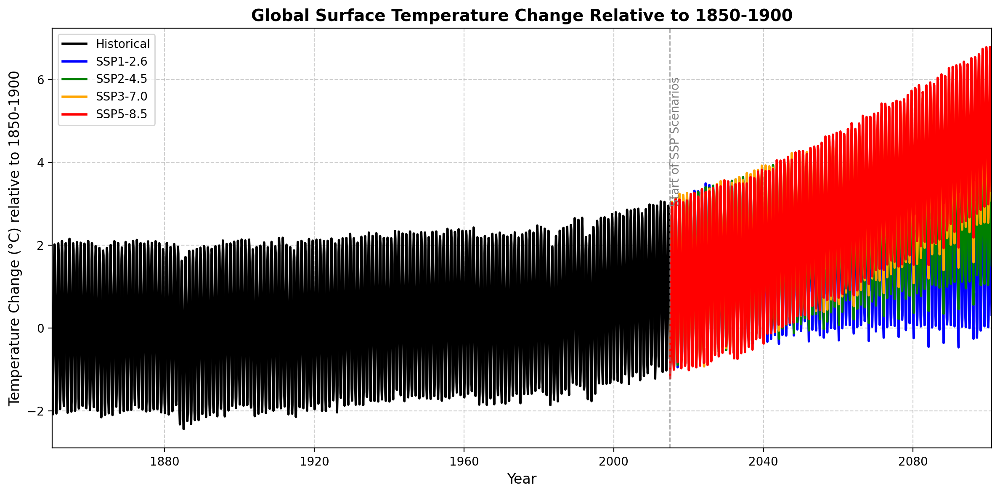

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the historical data
historical_file = "/content/ensemble_historical_global_south_asia_bangladesh.xlsx"
historical_data = pd.read_excel(historical_file)

# Load the scenario data
scenario_file = "/content/ensemble_scenarios_global_south_asia_bangladesh.xlsx"
scenario_data = pd.read_excel(scenario_file)

# Convert 'time' column to datetime in both DataFrames
historical_data['time'] = pd.to_datetime(historical_data['time'], errors='coerce')
scenario_data['time'] = pd.to_datetime(scenario_data['time'], errors='coerce')

# Drop rows with invalid dates (NaT) if any
historical_data = historical_data.dropna(subset=['time'])
scenario_data = scenario_data.dropna(subset=['time'])

# Merge the historical and scenario data on 'time'
all_data = pd.merge(historical_data, scenario_data, on='time', how='outer')

# Calculate the baseline (1850-1900 average) using historical data only
baseline_columns = ['Global_historical', 'Bangladesh_historical', 'South_Asia_historical']
baseline = all_data[(all_data['time'].dt.year >= 1850) & (all_data['time'].dt.year <= 1900)][baseline_columns].mean()

# Calculate temperature change relative to the baseline
for column in all_data.columns:
    if column != 'time':
        if column in baseline_columns:
            # For historical data, subtract the historical baseline
            all_data[column] -= baseline[column]
        else:
            # For scenario data, subtract the corresponding historical baseline
            # Example: 'Global_ssp126' uses 'Global_historical' baseline
            baseline_column = column.replace('ssp126', 'historical').replace('ssp245', 'historical').replace('ssp370', 'historical').replace('ssp585', 'historical')
            if baseline_column in baseline:
                all_data[column] -= baseline[baseline_column]

# Plot the data
plt.figure(figsize=(12, 6))

# Plot historical data
plt.plot(all_data['time'], all_data['Global_historical'], color='black', linewidth=2, label='Historical')

# Plot each scenario
scenarios = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
colors = ['blue', 'green', 'orange', 'red']
labels = ['SSP1-2.6', 'SSP2-4.5', 'SSP3-7.0', 'SSP5-8.5']

for scenario, color, label in zip(scenarios, colors, labels):
    column_name = f'Global_{scenario}'
    if column_name in all_data.columns:
        plt.plot(all_data['time'], all_data[column_name], color=color, linewidth=2, label=label)

# Add a vertical line at 2015 to indicate the start of SSP scenarios
plt.axvline(pd.to_datetime('2015-01-01'), color='gray', linestyle='--', linewidth=1, alpha=0.7)
plt.text(pd.to_datetime('2015-01-01'), 4.5, 'Start of SSP Scenarios', rotation=90, verticalalignment='center', color='gray')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Temperature Change (°C) relative to 1850-1900', fontsize=12)
plt.title('Global Surface Temperature Change Relative to 1850-1900', fontsize=14, fontweight='bold')

# Add a legend
plt.legend(loc='upper left', fontsize=10)

# Customize the grid
plt.grid(True, linestyle='--', alpha=0.6)

# Set x-axis limits to focus on the relevant period
plt.xlim(pd.to_datetime('1850-01-01'), pd.to_datetime('2100-12-31'))

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
print("Historical data 'time' dtype:", historical_data['time'].dtype)
print("Scenario data 'time' dtype:", scenario_data['time'].dtype)

Historical data 'time' dtype: datetime64[ns]
Scenario data 'time' dtype: datetime64[ns]


In [ ]:
print("Historical data NaT rows:", historical_data[historical_data['time'].isna()])
print("Scenario data NaT rows:", scenario_data[scenario_data['time'].isna()])

Historical data NaT rows: Empty DataFrame
Columns: [time, Bangladesh_historical, Global_historical, South_Asia_historical]
Index: []
Scenario data NaT rows: Empty DataFrame
Columns: [time, Bangladesh_ssp126, Bangladesh_ssp245, Bangladesh_ssp370, Bangladesh_ssp585, Global_ssp126, Global_ssp245, Global_ssp370, Global_ssp585, South_Asia_ssp126, South_Asia_ssp245, South_Asia_ssp370, South_Asia_ssp585]
Index: []


# Merging

In [ ]:
import pandas as pd
import glob
import os

# Define folder path
folder_path = "/content/drive/My Drive/CCRM TP"  # Change this to your actual folder path

# Get list of Excel files
files = glob.glob(os.path.join(folder_path, "*.xlsx"))

# Initialize an empty list to store data
data_list = []

for file in files:
    # Extract scenario_model from filename
    filename = os.path.basename(file).replace("_monthly_temperatures.xlsx", "")

    # Read the Excel file
    df = pd.read_excel(file, usecols=["time", "tas"])

    # Rename columns
    df.columns = [f"time_{filename}", filename]

    # Append to list
    data_list.append(df)

# Merge all DataFrames on index
merged_df = pd.concat(data_list, axis=1)

# Save to a new Excel file
output_file = os.path.join(folder_path, "merged_temperatures.xlsx")
merged_df.to_excel(output_file, index=False)

print(f"Merged file saved as: {output_file}")


Merged file saved as: /content/drive/My Drive/CCRM TP/merged_temperatures.xlsx
